<a href="https://colab.research.google.com/github/rhqrhq/Adversarial_Examples_Papers/blob/main/pTRpred1101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [189]:
pip install --upgrade pandas


In [190]:
pip install pmdarima

In [191]:
pip install numpy==1.26.4


In [192]:
import pmdarima

In [193]:
# roll_windows
from typing import Sequence, Literal
import numpy as np
import pandas as pd

def roll_windows(
    time: Sequence,
    window: int,
    step: int = 1,
    align: Literal["end", "center", "start"] = "end",
    type: Literal["rolling", "expanding"] = "rolling",
) -> pd.DataFrame:
    """
    Build rolling / expanding window indices over a time vector.
    """
    if window < 1:
        raise ValueError("`window` must be >= 1")
    if step < 1:
        raise ValueError("`step` must be >= 1")

    align = align.lower()
    if align not in {"end", "center", "start"}:
        raise ValueError("`align` must be one of {'end','center','start'}")

    type = type.lower()
    if type not in {"rolling", "expanding"}:
        raise ValueError("`type` must be one of {'rolling','expanding'}")

    ts = pd.Series(time)
    n = len(ts)

    if type == "rolling":
        if n < window:
            starts = np.array([1], dtype=int)
            ends   = np.array([n], dtype=int)
        else:
            starts = np.arange(1, n - window + 2, step, dtype=int)
            ends   = starts + window - 1
    else:
        if n < window:
            ends = np.array([n], dtype=int)
        else:
            ends = np.arange(window, n + 1, step, dtype=int)
            if ends.size == 0:
                ends = np.array([n], dtype=int)
        starts = np.full_like(ends, 1)

    if align == "end":
        t_rep_idx_1b = ends
    elif align == "start":
        t_rep_idx_1b = starts
    else:
        t_rep_idx_1b = np.floor((starts + ends) / 2).astype(int)

    t_rep = ts.iloc[t_rep_idx_1b - 1].to_numpy()
    idx_list = [list(range(int(s), int(e) + 1)) for s, e in zip(starts, ends)]

    out = pd.DataFrame({
        "window_id": np.arange(1, len(starts) + 1, dtype=int),
        "start": starts,
        "end": ends,
        "t_rep": t_rep,
        "idx": idx_list,
    })
    return out

In [194]:
# extract_X
import pandas as pd
from typing import Sequence, Union

def extract_X(data: pd.DataFrame, x_cols: Union[Sequence[str], str]) -> pd.DataFrame:
    """
    Extract a numeric matrix (as a pandas DataFrame) from a data frame.

    Parameters
    ----------
    data : pd.DataFrame
        Must contain the columns of interest.
    x_cols : list of str or str
        - A list of exact column names, e.g. ["temp1","temp2"]
        - A single regex string containing '|' to match multiple names, e.g. "temp|volt"

    Returns
    -------
    pd.DataFrame
        Numeric DataFrame with preserved column names.
    """
    if not isinstance(data, pd.DataFrame):
        raise ValueError("`data` must be a pandas DataFrame.")

    if isinstance(x_cols, str):
        if "|" in x_cols:
            keep = data.filter(regex=x_cols).columns.tolist()
        else:
            keep = [x_cols]
    elif isinstance(x_cols, (list, tuple)):
        keep = list(x_cols)
    else:
        raise ValueError("`x_cols` must be a list of names or a single regex string.")

    if len(keep) == 0:
        raise ValueError("No columns selected by `x_cols`.")

    X = data.loc[:, keep].copy()
    for c in keep:
        X[c] = pd.to_numeric(X[c], errors="coerce")

    return X

In [195]:
# na_handle
import numpy as np
import pandas as pd
from typing import Literal, Union

def na_handle(
    M: Union[np.ndarray, pd.DataFrame],
    method: Literal["omit_rows","impute_mean","pairwise_complete"] = "omit_rows"
) -> np.ndarray:
    """
    Simple NA handling for numeric matrices.

    Parameters
    ----------
    M : array-like (numpy array or pandas DataFrame)
        Numeric-like object.
    method : {"omit_rows","impute_mean","pairwise_complete"}
        - "omit_rows": drop any rows containing NaN
        - "impute_mean": impute NaNs with column means (if >=2 non-NA values)
        - "pairwise_complete": leave NAs as-is

    Returns
    -------
    numpy.ndarray
        Numeric matrix with NAs handled.
    """
    if isinstance(M, pd.DataFrame):
        A = M.to_numpy(dtype=float)
    else:
        A = np.asarray(M, dtype=float)

    if method == "omit_rows":
        mask = ~np.isnan(A).any(axis=1)
        return A[mask, :]

    if method == "impute_mean":
        A_copy = A.copy()
        for j in range(A_copy.shape[1]):
            col = A_copy[:, j]
            nan_mask = np.isnan(col)
            if not nan_mask.any():
                continue
            n_non_na = np.sum(~nan_mask)
            if n_non_na <= 1:
                # 0 or 1 observed values -> leave NaNs as NaN
                continue
            m = np.nanmean(col)
            A_copy[nan_mask, j] = m
        return A_copy

    if method == "pairwise_complete":
        return A

    raise ValueError("`method` must be one of {'omit_rows','impute_mean','pairwise_complete'}")

In [196]:
# roll_svd
from typing import List, Optional, Sequence, Literal, Dict, Any
import numpy as np
import pandas as pd

# Assumes roll_windows, extract_X, and na_handle are already defined.

def _cov_window(
    Xc: pd.DataFrame,
    na_action: Literal["omit_rows","impute_mean","pairwise_complete"],
    cov_on_pairwise: bool
) -> np.ndarray:
    """
    Compute covariance for a single window, honoring pairwise-complete option.
    Returns a (p x p) numpy array.
    """
    if na_action == "pairwise_complete" and cov_on_pairwise:
        S = Xc.cov(min_periods=2)  # pairwise complete by default
        return S.to_numpy()
    else:
        Xc2 = Xc.dropna(axis=0, how="any")
        if Xc2.shape[0] < 2:
            return np.full((Xc.shape[1], Xc.shape[1]), np.nan, dtype=float)
        return np.cov(Xc2.to_numpy(), rowvar=False, ddof=1)

def roll_svd(
    data: pd.DataFrame,
    time: str,
    x_cols: Sequence[str] | str,
    window: int,
    step: int = 1,
    align: Literal["end", "center", "start"] = "end",
    type: Literal["rolling", "expanding"] = "rolling",
    center: bool = True,
    scale_: bool = False,
    k: Optional[int] = None,
    fast: bool = True,
    na_action: Literal["omit_rows","impute_mean","pairwise_complete"] = "omit_rows",
    cov_on_pairwise: bool = True,
    values_only: bool = True,
    seed: Optional[int] = None,
) -> Dict[str, Any]:
    """
    Rolling SVD (eigendecomposition) of per-window covariance.

    Returns a dict with:
      - windows   : DataFrame from roll_windows (one row per window)
      - D         : list of 1D numpy arrays (eigenvalues per window)
      - V         : list of (p x k) numpy arrays (eigenvectors) or None if values_only
      - U_scores  : list of (n_w x k) numpy arrays (standardized scores) or None if values_only
      - k         : requested k (or None if not set)
      - colnames  : list of feature names
      - preproc   : {'center': bool, 'scale.': bool}
      - values_only : bool
    """
    if time not in data.columns:
        raise ValueError("`time` must be a column in `data`.")
    if seed is not None:
        np.random.seed(seed)

    windows = roll_windows(data[time].to_numpy(), window, step, align, type)
    X_all = extract_X(data, x_cols)
    colnames = list(X_all.columns)
    p = X_all.shape[1]

    nW = windows.shape[0]
    D_list: List[Optional[np.ndarray]] = [None] * nW
    V_list: Optional[List[Optional[np.ndarray]]] = None if values_only else [None] * nW
    U_list: Optional[List[Optional[np.ndarray]]] = None if values_only else [None] * nW

    _have_scipy = False
    if fast:
        try:
            from scipy.sparse.linalg import eigsh  # type: ignore
            _have_scipy = True
        except Exception:
            _have_scipy = False

    for w in range(nW):
        idx_1b = windows.iloc[w]["idx"]          # list of 1-based indices
        idx_0b = [i - 1 for i in idx_1b]         # convert to 0-based
        Xw = X_all.iloc[idx_0b, :].copy()

        # NA handling (per window)
        if na_action == "omit_rows":
            Xw = Xw.dropna(axis=0, how="any")
        elif na_action == "impute_mean":
            Xw = Xw.copy()
            for c in Xw.columns:
                arr = Xw[c].to_numpy()
                nan_mask = np.isnan(arr)
                if nan_mask.any():
                    n_non_na = (~nan_mask).sum()
                    if n_non_na > 1:
                        Xw.loc[nan_mask, c] = np.nanmean(arr)
        elif na_action == "pairwise_complete":
            pass
        else:
            raise ValueError("`na_action` must be one of {'omit_rows','impute_mean','pairwise_complete'}")

        n_w = Xw.shape[0]
        if n_w < 2:
            continue  # skip this window; entries remain None

        # Center/scale per window
        if center:
            mu = Xw.mean(axis=0, skipna=True)
        else:
            mu = pd.Series(np.zeros(p), index=Xw.columns)

        if scale_:
            sc = Xw.std(axis=0, ddof=1, skipna=True).replace(0, np.nan)
        else:
            sc = pd.Series(np.ones(p), index=Xw.columns)

        sc = sc.fillna(1.0)
        Xc = (Xw - mu) / sc

        # Effective k for this window
        kk = min(k if k is not None else min(n_w, p), n_w, p)

        # Covariance for this window
        S = _cov_window(Xc, na_action, cov_on_pairwise)
        if not np.isfinite(S).all():
            continue

        if values_only:
            vals = np.linalg.eigvalsh(S)[::-1]  # descending
            D_list[w] = vals[:kk].copy()
        else:
            if _have_scipy and kk < p:
                from scipy.sparse.linalg import eigsh  # type: ignore
                vals, vecs = eigsh(S, k=kk, which="LA")
                order = np.argsort(-vals)
                vals = vals[order]
                vecs = vecs[:, order]
            else:
                vals_full, vecs_full = np.linalg.eigh(S)  # ascending
                order = np.argsort(-vals_full)
                vals = vals_full[order][:kk]
                vecs = vecs_full[:, order][:, :kk]

            D_list[w] = vals.copy()
            V_list[w] = vecs.copy() if V_list is not None else None
            if U_list is not None:
                U_list[w] = Xc.to_numpy() @ vecs

    return {
        "windows": windows,
        "D": D_list,
        "V": V_list,
        "U_scores": U_list,
        "k": (None if k is None else int(k)),
        "colnames": colnames,
        "preproc": {"center": bool(center), "scale.": bool(scale_)},
        "values_only": bool(values_only),
    }

In [197]:
# fit_arimax_vec
import numpy as np
from typing import Optional, Dict, Any
import warnings

def fit_arimax_vec(
    y,
    xreg: Optional[np.ndarray] = None,
    seasonal: bool = True,
    stepwise: bool = True,
    approximation: bool = False,
    **kwargs: Any,
) -> Dict[str, Any]:
    """
    Fit a single ARIMAX model (auto-selected order) and return aligned residuals/fitted.

    Parameters
    ----------
    y : array-like
        Dependent (response) series.
    xreg : array-like, optional
        Exogenous regressors (rows must align with y).
    seasonal : bool, default True
        Passed to pmdarima.auto_arima.
    stepwise : bool, default True
        Passed to pmdarima.auto_arima.
    approximation : bool, default False
        Passed to pmdarima.auto_arima.
    **kwargs :
        Additional arguments forwarded to pmdarima.auto_arima().

    Returns
    -------
    dict with keys:
      - model      : fitted pmdarima model object
      - residuals  : np.ndarray (residuals for the rows used)
      - fitted     : np.ndarray (fitted values for the rows used)
      - mask       : np.ndarray of bools (length len(y)), True where rows were used
    """
    try:
        import pmdarima as pm
    except Exception as e:
        raise ImportError(
            "Package 'pmdarima' is required but not installed. "
            "Install it with: pip install pmdarima"
        ) from e

    y_arr = np.asarray(y, dtype=float).reshape(-1)
    n = y_arr.shape[0]

    if xreg is not None:
        X = np.asarray(xreg, dtype=float)
        if X.ndim == 1:
            X = X.reshape(-1, 1)
        if X.shape[0] != n:
            raise ValueError("`xreg` must have the same number of rows as `y`.")
        ok = np.isfinite(y_arr) & np.isfinite(X).all(axis=1)
        X_used = X[ok, :]
    else:
        ok = np.isfinite(y_arr)
        X_used = None

    if not np.any(ok):
        raise ValueError("No complete cases available for ARIMAX fit.")

    y_used = y_arr[ok]

    # Silence convergence/numerical warnings unless user wants them
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        model = pm.auto_arima(
            y=y_used,
            X=X_used,
            seasonal=seasonal,
            stepwise=stepwise,
            approximation=approximation,
            error_action="warn",
            suppress_warnings=True,
            **kwargs,
        )

    # In-sample predictions and residuals on the used subset
    try:
        fitted_used = model.predict_in_sample(X=X_used)
    except TypeError:
        # older pmdarima signature may use 'exogenous'
        fitted_used = model.predict_in_sample(exogenous=X_used)

    # Some versions expose residuals via .resid(), others via attribute
    try:
        resid_used = model.resid()
    except Exception:
        resid_used = y_used - np.asarray(fitted_used, dtype=float)

    fitted_used = np.asarray(fitted_used, dtype=float).reshape(-1)
    resid_used = np.asarray(resid_used, dtype=float).reshape(-1)

    return {
        "model": model,
        "residuals": resid_used,
        "fitted": fitted_used,
        "mask": ok,
    }

In [198]:
import numpy as np
import pandas as pd
from typing import Sequence, Dict, Any, Optional

# Assumes extract_X(...) and fit_arimax_vec(...) are defined.

def arimax_residuals_df(
    data: pd.DataFrame,
    time: str,
    y_cols: Sequence[str] | str,
    xreg_cols: Sequence[str] | str,
    seasonal: bool = True,
    stepwise: bool = True,
    approximation: bool = False,
    **kwargs: Any,
) -> Dict[str, Any]:
    """
    Batch ARIMAX residuals for multiple series with a common regressor set.

    Returns
    -------
    dict with keys:
      - residuals_df : DataFrame with columns [time] + one column per y series
      - models       : dict of fitted models keyed by series name
      - mask         : boolean mask (length nrow(data)) for rows used (complete cases)
    """
    if time not in data.columns:
        raise ValueError("`time` must be a column in `data`.")

    Ymat = extract_X(data, y_cols)          # n x p_y
    Xreg = extract_X(data, xreg_cols)       # n x p_x
    tvec = data[time].to_numpy()

    # Global complete-case mask across all selected y and xreg columns
    ok = np.isfinite(Ymat.to_numpy()).all(axis=1) & np.isfinite(Xreg.to_numpy()).all(axis=1)
    if not np.any(ok):
        raise ValueError("No complete cases across y_cols and xreg_cols for ARIMAX.")

    Y_ok = Ymat.loc[ok, :].reset_index(drop=True)
    X_ok = Xreg.loc[ok, :].reset_index(drop=True)
    t_ok = tvec[ok]

    n_ok, p_y = Y_ok.shape
    Resids = np.full((n_ok, p_y), np.nan, dtype=float)
    models: Dict[str, Any] = {}

    for j, col in enumerate(Y_ok.columns):
        fitj = fit_arimax_vec(
            y=Y_ok[col].to_numpy(),
            xreg=X_ok.to_numpy(),
            seasonal=seasonal,
            stepwise=stepwise,
            approximation=approximation,
            **kwargs,
        )
        inner_ok = fitj["mask"]  # mask relative to Y_ok (length n_ok)
        Resids[inner_ok, j] = fitj["residuals"]
        models[col] = fitj["model"]

    residuals_df = pd.DataFrame({"time": t_ok})
    for j, col in enumerate(Y_ok.columns):
        residuals_df[col] = Resids[:, j]

    return {"residuals_df": residuals_df, "models": models, "mask": ok}

In [199]:
# arimax_residuals_df
import numpy as np
import pandas as pd
from typing import Sequence, Dict, Any, Optional

# Assumes extract_X(...) and fit_arimax_vec(...) are defined.

def arimax_residuals_df(
    data: pd.DataFrame,
    time: str,
    y_cols: Sequence[str] | str,
    xreg_cols: Sequence[str] | str,
    seasonal: bool = True,
    stepwise: bool = True,
    approximation: bool = False,
    **kwargs: Any,
) -> Dict[str, Any]:
    """
    Batch ARIMAX residuals for multiple series with a common regressor set.

    Returns
    -------
    dict with keys:
      - residuals_df : DataFrame with columns [time] + one column per y series
      - models       : dict of fitted models keyed by series name
      - mask         : boolean mask (length nrow(data)) for rows used (complete cases)
    """
    if time not in data.columns:
        raise ValueError("`time` must be a column in `data`.")

    Ymat = extract_X(data, y_cols)          # n x p_y
    Xreg = extract_X(data, xreg_cols)       # n x p_x
    tvec = data[time].to_numpy()

    # Global complete-case mask across all selected y and xreg columns
    ok = np.isfinite(Ymat.to_numpy()).all(axis=1) & np.isfinite(Xreg.to_numpy()).all(axis=1)
    if not np.any(ok):
        raise ValueError("No complete cases across y_cols and xreg_cols for ARIMAX.")

    Y_ok = Ymat.loc[ok, :].reset_index(drop=True)
    X_ok = Xreg.loc[ok, :].reset_index(drop=True)
    t_ok = tvec[ok]

    n_ok, p_y = Y_ok.shape
    Resids = np.full((n_ok, p_y), np.nan, dtype=float)
    models: Dict[str, Any] = {}

    for j, col in enumerate(Y_ok.columns):
        fitj = fit_arimax_vec(
            y=Y_ok[col].to_numpy(),
            xreg=X_ok.to_numpy(),
            seasonal=seasonal,
            stepwise=stepwise,
            approximation=approximation,
            **kwargs,
        )
        inner_ok = fitj["mask"]  # mask relative to Y_ok (length n_ok)
        Resids[inner_ok, j] = fitj["residuals"]
        models[col] = fitj["model"]

    residuals_df = pd.DataFrame({"time": t_ok})
    for j, col in enumerate(Y_ok.columns):
        residuals_df[col] = Resids[:, j]

    return {"residuals_df": residuals_df, "models": models, "mask": ok}

In [200]:
# arimax_then_roll_svd
import pandas as pd
import matplotlib.pyplot as plt

from typing import Sequence, Dict, Any, Optional, Literal

# Assumes arimax_residuals_df(...) and roll_svd(...) are defined.

def arimax_then_roll_svd(
    data: pd.DataFrame,
    time: str,
    y_cols: Sequence[str] | str,
    xreg_cols: Sequence[str] | str,
    window: int,
    step: int = 1,
    align: Literal["end", "center", "start"] = "end",
    type: Literal["rolling", "expanding"] = "rolling",
    center: bool = True,
    scale_: bool = False,
    k: Optional[int] = None,
    fast: bool = True,
    na_action: Literal["omit_rows","impute_mean","pairwise_complete"] = "omit_rows",
    cov_on_pairwise: bool = True,
    seasonal: bool = True,
    stepwise: bool = True,
    approximation: bool = False,
    values_only: bool = True,
    seed: Optional[int] = None,
    **kwargs: Any,
) -> Dict[str, Any]:
    """
    Pipeline: ARIMAX residuals → rolling SVD on residual covariance.

    Returns
    -------
    dict with keys:
      - residuals_df : DataFrame of aligned ARIMAX residuals with a 'time' column
      - rollsvd      : dict returned by roll_svd(...)
      - models       : dict of fitted ARIMAX models keyed by series name
      - mask         : boolean mask over original rows used in ARIMAX fits
    """
    fit = arimax_residuals_df(
        data=data,
        time=time,
        y_cols=y_cols,
        xreg_cols=xreg_cols,
        seasonal=seasonal,
        stepwise=stepwise,
        approximation=approximation,
        **kwargs,
    )

    residuals_df = fit["residuals_df"]
    # Feature columns are everything after 'time'
    res_cols = [c for c in residuals_df.columns if c != "time"]

    svd_fit = roll_svd(
        data=residuals_df,
        time="time",
        x_cols=res_cols,                 # pass explicit list of columns
        window=window,
        step=step,
        align=align,
        type=type,
        center=center,
        scale_=scale_,
        k=k,
        fast=fast,
        na_action=na_action,
        cov_on_pairwise=cov_on_pairwise,
        values_only=values_only,
        seed=seed,
    )

    return {
        "residuals_df": residuals_df,
        "rollsvd": svd_fit,
        "models": fit["models"],
        "mask": fit["mask"],
    }

In [201]:
# as_tibble_rollsvd
import pandas as pd
from typing import Literal, Dict, Any, List, Optional

def as_tibble_rollsvd(
    x: Dict[str, Any],
    what: Literal["loadings", "singular_values"] = "singular_values",
) -> Optional[pd.DataFrame]:
    """
    Tidy a rollsvd object (dict from roll_svd) into a long DataFrame.

    Parameters
    ----------
    x : dict
        Output from roll_svd(...).
    what : {"loadings","singular_values"}, default "singular_values"
        - "loadings": requires roll_svd(..., values_only=False).
          Returns columns: window_id, variable, factor, loading.
        - "singular_values": always available.
          Returns columns: window_id, factor, d.

    Returns
    -------
    pd.DataFrame or None
        Long-format DataFrame, or None if no windows contained results.
    """
    if not isinstance(x, dict) or "D" not in x:
        raise ValueError("`x` must be a dict returned by roll_svd (with key 'D').")

    V_list: Optional[List[Optional[Any]]] = x.get("V", None)
    D_list: List[Optional[Any]] = x.get("D", [])
    colnames: List[str] = x.get("colnames", [])

    if V_list is not None:
        W = len(V_list)
    elif D_list is not None:
        W = len(D_list)
    else:
        W = 0

    if W == 0:
        return None

    out_frames: List[pd.DataFrame] = []

    if what == "loadings":
        if V_list is None:
            raise ValueError("Loadings not available: roll_svd was run with values_only=True.")
        for w in range(W):
            V = V_list[w]
            if V is None:
                continue
            p, k = V.shape
            dfw = pd.DataFrame({
                "window_id": (w + 1),
                "variable": colnames * k,
                "factor": sum(([i + 1] * p for i in range(k)), []),
                "loading": V.reshape(-1, order="F"),  # match as.vector(column-major)
            })
            out_frames.append(dfw)
    elif what == "singular_values":
        for w in range(W):
            D = D_list[w]
            if D is None:
                continue
            dfw = pd.DataFrame({
                "window_id": (w + 1),
                "factor": list(range(1, len(D) + 1)),
                "d": list(map(float, D)),
            })
            out_frames.append(dfw)
    else:
        raise ValueError("`what` must be 'loadings' or 'singular_values'.")

    if not out_frames:
        return None

    out = pd.concat(out_frames, axis=0, ignore_index=True)
    return out

In [202]:
# signals
import numpy as np
import pandas as pd
from typing import Sequence, Literal, Optional, Any

# Assumes: roll_svd, extract_X, fit_arimax_vec, arimax_residuals_df are defined.

def build_signal_raw(data: pd.DataFrame, time: str, col: str) -> pd.DataFrame:
    """
    Raw single-column series → (time_ind, signal)
    """
    if time not in data.columns:
        raise ValueError("`time` must be a column in `data`.")
    if col not in data.columns:
        raise ValueError("`col` must be a column in `data`.")
    return pd.DataFrame({
        "time_ind": data[time].to_numpy(),
        "signal": pd.to_numeric(data[col], errors="coerce").to_numpy(),
    })

def build_signal_svd(
    data: pd.DataFrame,
    time: str,
    x_cols: Sequence[str] | str,
    window: int,
    step: int = 1,
    align: Literal["end", "center", "start"] = "end",
    type: Literal["rolling", "expanding"] = "rolling",
    center: bool = True,
    scale_: bool = True,
    fast: bool = True,
    na_action: Literal["omit_rows","impute_mean","pairwise_complete"] = "omit_rows",
    cov_on_pairwise: bool = True,
    seed: Optional[int] = None,
) -> pd.DataFrame:
    """
    Rolling SVD top eigenvalue (s1) → (t_rep, s1)
    """
    fit = roll_svd(
        data=data, time=time, x_cols=x_cols,
        window=window, step=step, align=align, type=type,
        center=center, scale_=scale_, k=1,
        fast=fast, na_action=na_action, cov_on_pairwise=cov_on_pairwise,
        values_only=True, seed=seed
    )
    # Extract s1 per window; windows without values -> NaN
    s1 = [ (np.nan if (d is None or len(d) < 1) else float(d[0])) for d in fit["D"] ]
    return pd.DataFrame({
        "time_ind": fit["windows"]["t_rep"].to_numpy(),
        "signal": np.asarray(s1, dtype=float)
    })

def build_signal_arimax_resid(
    data: pd.DataFrame,
    time: str,
    y_col: Sequence[str] | str,
    xreg_cols: Sequence[str] | str,
    seasonal: bool = True,
    stepwise: bool = True,
    approximation: bool = False,
    **kwargs: Any,
) -> pd.DataFrame:
    """
    ARIMAX residuals (single y + predictors) → (time_ind, residual)
    """
    if time not in data.columns:
        raise ValueError("`time` must be a column in `data`.")

    y_df = extract_X(data, y_col)
    if y_df.shape[1] != 1:
        raise ValueError("`y_col` must select exactly one column.")
    X = extract_X(data, xreg_cols)

    t = data[time].to_numpy()
    fit = fit_arimax_vec(
        y=y_df.iloc[:, 0].to_numpy(),
        xreg=X.to_numpy(),
        seasonal=seasonal,
        stepwise=stepwise,
        approximation=approximation,
        **kwargs
    )
    return pd.DataFrame({
        "time_ind": t[fit["mask"]],
        "signal": fit["residuals"]
    })

def build_signal_arimax_svd(
    data: pd.DataFrame,
    time: str,
    y_cols: Sequence[str] | str,
    xreg_cols: Sequence[str] | str,
    window: int,
    step: int = 1,
    align: Literal["end", "center", "start"] = "end",
    type: Literal["rolling", "expanding"] = "rolling",
    center: bool = True,
    scale_: bool = True,
    fast: bool = True,
    na_action: Literal["omit_rows","impute_mean","pairwise_complete"] = "omit_rows",
    cov_on_pairwise: bool = True,
    seasonal: bool = True,
    stepwise: bool = True,
    approximation: bool = False,
    seed: Optional[int] = None,
    **kwargs: Any,
) -> pd.DataFrame:
    """
    ARIMAX residuals for multiple series → rolling SVD s1 → (t_rep, s1)
    """
    # 1) residuals (aligned by common mask)
    arx = arimax_residuals_df(
        data=data, time=time, y_cols=y_cols, xreg_cols=xreg_cols,
        seasonal=seasonal, stepwise=stepwise, approximation=approximation, **kwargs
    )

    # 2) SVD on residuals (s1 only)
    residuals_df = arx["residuals_df"]
    res_cols = [c for c in residuals_df.columns if c != "time"]

    fit = roll_svd(
        data=residuals_df, time="time", x_cols=res_cols,
        window=window, step=step, align=align, type=type,
        center=center, scale_=scale_, k=1,
        fast=fast, na_action=na_action, cov_on_pairwise=cov_on_pairwise,
        values_only=True, seed=seed
    )

    s1 = [ (np.nan if (d is None or len(d) < 1) else float(d[0])) for d in fit["D"] ]
    return pd.DataFrame({
        "time_ind": fit["windows"]["t_rep"].to_numpy(),
        "signal": np.asarray(s1, dtype=float)
    })

In [203]:
import numpy as np

def detect_asvotes(signal,
                   lowwl=5,
                   highwl="auto",
                   mad_k=3,
                   direction="positive"):
    """
    Adaptive slope-vote detector (Python port of the provided R function).

    Parameters
    ----------
    signal : array-like
        The input sequence (will be coerced to float).
    lowwl : int, default 5
        Minimum window length.
    highwl : int or "auto", default "auto"
        Maximum window length. If "auto", set to max(5, floor(n/3)).
    mad_k : float, default 3
        Z-score threshold in MAD units for outlier slopes.
    direction : {"positive", "both", "negative"}
        Which slope directions to count as votes.

    Returns
    -------
    votes : np.ndarray of shape (n,)
        Pointwise vote scores normalized by the number of window lengths considered.
    """
    y = np.asarray(signal, dtype=float)
    n = y.size
    if n < 3:
        return np.zeros(n, dtype=float)

    if direction not in ("positive", "both", "negative"):
        raise ValueError("direction must be 'positive', 'both', or 'negative'")

    # Determine upper bound for w
    if highwl == "auto":
        highwl_val = max(5, n // 3)
    else:
        highwl_val = int(highwl)
    lowwl_val = int(lowwl)
    if lowwl_val < 2:
        lowwl_val = 2
    if highwl_val < lowwl_val:
        highwl_val = lowwl_val

    wls = np.arange(lowwl_val, highwl_val + 1, dtype=int)
    votes = np.zeros(n, dtype=float)
    n_wls = wls.size

    def robust_z(x):
        # median / raw MAD (constant = 1), ignore NaNs
        med = np.nanmedian(x)
        mad = np.nanmedian(np.abs(x - med))
        if not np.isfinite(mad) or mad == 0:
            mad = 1e-8
        return (x - med) / mad

    for w in wls:
        # Trim symmetrically to an integer number of full blocks of length w
        rem = n % w
        if rem == 0:
            start = 0
            end = n
        else:
            pad = rem // 2
            start = pad
            end = n - (rem - pad)

        if end - start < w:
            continue

        idx = np.arange(start, end, dtype=int)
        B = idx.size // w
        if B == 0:
            continue

        # Reshape y[idx] into w x B, column-wise like R (byrow=FALSE)
        y_block = y[idx][:w * B].reshape((w, B), order="F")

        # Precompute centered time and denom for slope
        t = np.arange(1, w + 1, dtype=float)
        t_centered = t - (w + 1) / 2.0
        denom = np.sum(t_centered * t_centered)

        # slope for each block; NaN if any NA in the block
        has_na = np.any(~np.isfinite(y_block), axis=0)
        num = t_centered @ y_block
        slopes = num / denom
        slopes[has_na] = np.nan

        z = robust_z(slopes)
        if np.all(~np.isfinite(z)):
            continue

        vote_sign = np.zeros(B, dtype=int)
        if direction == "positive":
            vote_sign[z > mad_k] = +1
        elif direction == "negative":
            vote_sign[z < -mad_k] = +1  # count presence of negative-only as +1
        else:  # both
            vote_sign[z > mad_k] = +1
            vote_sign[z < -mad_k] = -1

        nz_blocks = np.nonzero(vote_sign != 0)[0]
        if nz_blocks.size:
            # For block b (0-based), positions within idx are [b*w : (b+1)*w)
            for b in nz_blocks:
                block_slice = slice(b * w, (b + 1) * w)
                votes[idx[block_slice]] += vote_sign[b]

    if n_wls > 0:
        votes = votes / n_wls
    return votes

In [226]:
# detect_realtime
import numpy as np
import pandas as pd
from typing import Literal, Union, Sequence, Optional



# detect_realtime
import numpy as np
import pandas as pd
from typing import Literal, Union, Sequence, Optional, Any, Dict, List
import pmdarima

def detect_realtime(
    time: Sequence,
    signal: Union[Sequence[float], np.ndarray],
    lowwl: int = 5,
    highwl: Union[str, int] = "auto",
    mad_k: float = 3.0,
    direction: Literal["positive", "both", "negative"] = "positive",
    burn_in: Optional[int] = None,
    smooth_k: int = 30,
    threshold: float = 1.3,
) -> pd.DataFrame:
    """
    Real-time multi-scale slope voting (AS-votes) wrapper.
    Computes offline detector on full series and real-time detector on prefixes.
    """
    t = np.asarray(time)
    y = np.asarray(signal, dtype=float).reshape(-1)
    n = y.size
    if t.shape[0] != n:
        raise ValueError("`time` and `signal` lengths must match.")

    if n < 3:
        return pd.DataFrame({
            "time_ind": t,
            "signal": y,
            "detected_offline": np.zeros(n, dtype=float),
            "detected_value_rt": np.zeros(n, dtype=float),
            "flag": np.zeros(n, dtype=bool),
            "first_detection_time": np.array([np.nan] * n, dtype=object),
        })

    if burn_in is None:
        burn_in = max(100, 5 * int(lowlwl := lowwl))
    burn_in = int(max(2, min(burn_in, n)))

    offline = detect_asvotes(
        signal=y,
        lowwl=lowlwl if 'lowlwl' in locals() else lowwl,
        highwl=highwl,
        mad_k=mad_k,
        direction=direction,
    )

    rt = np.full(n, np.nan, dtype=float)

    burn_highwl = "auto" if (isinstance(highwl, str) and highwl.lower() == "auto") else min(int(highwl), burn_in)
    det_burn = detect_asvotes(
        signal=y[:burn_in],
        lowwl=lowlwl if 'lowlwl' in locals() else lowwl,
        highwl=burn_highwl,
        mad_k=mad_k,
        direction=direction,
    )

    if smooth_k > 0:
        k0 = min(smooth_k, det_burn.size)
        for i in range(burn_in):
            j1 = max(0, i - k0 + 1)
            rt[i] = np.nanmean(det_burn[j1:i+1])
    else:
        rt[:burn_in] = det_burn[:burn_in]

    for i in range(burn_in, n):
        cur_highwl = "auto" if (isinstance(highwl, str) and highwl.lower() == "auto") else min(int(highwl), i + 1)
        det_i = detect_asvotes(
            signal=y[:i+1],
            lowwl=lowlwl if 'lowlwl' in locals() else lowwl,
            highwl=cur_highwl,
            mad_k=mad_k,
            direction=direction,
        )
        if smooth_k > 0:
            k = min(smooth_k, det_i.size)
            j1 = max(0, i - k + 1)
            rt[i] = np.nanmean(det_i[j1:i+1])
        else:
            rt[i] = det_i[i]
        print(i)

    flag_vec = (rt >= threshold)
    if np.any(flag_vec):
        first_time = t[np.argmax(flag_vec)]
    else:
        first_time = np.nan

    out = pd.DataFrame({
        "time_ind": t,
        "signal": y,
        "detected_offline": offline,
        "detected_value_rt": rt,
        "flag": flag_vec,
        "first_detection_time": np.repeat(first_time, n).astype(object),
    })
    return out

def write_rt_csv(df: pd.DataFrame, path: str) -> str:
    """
    Write real-time detection output to CSV.
    """
    df.to_csv(path, index=False)
    return path

In [205]:
# plot_detection_overlay
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Optional

def plot_detection_overlay(
    df: pd.DataFrame,
    title: str = "Real-time Detection vs Signal after SVD \n Temperature, Current, Voltage",
    time_col: str = "time_ind",
    score_col: str = "detected_value_rt",
    signal_col: str = "signal",
    first_det_col: str = "first_detection_time",
    score_label: str = "Real-Time Detected Value",
    signal_label: str = "Signal",
    x_label: str = "Index",
    threshold: Optional[float] = None,
    scale_factor: Optional[float] = None,
    score_color: str = "red",
    signal_color: str = "black",
    save_path: Optional[str] = None,
    width: float = 9,
    height: float = 7.5,
    dpi: int = 300,
):
    """
    Overlay real-time detection score and signal with threshold & first-crossing.

    Creates a dual-axis plot with detection score (left y-axis) and the (optionally
    scaled) signal plotted on the same axis but labeled on the right in original units.
    """
    df_local = df.copy()

    x = df_local[time_col].to_numpy()
    sc = pd.to_numeric(df_local[score_col], errors="coerce").to_numpy()
    sg = pd.to_numeric(df_local[signal_col], errors="coerce").to_numpy()

    # Auto scale the signal onto the left axis range; right axis shows original via secondary label.
    if scale_factor is None:
        rng_sc = (np.nanmin(sc), np.nanmax(sc))
        rng_sg = (np.nanmin(sg), np.nanmax(sg))
        span_sc = rng_sc[1] - rng_sc[0]
        span_sg = rng_sg[1] - rng_sg[0]
        if not np.isfinite(span_sc) or span_sc == 0 or not np.isfinite(span_sg) or span_sg == 0:
            alpha = 1.0
        else:
            alpha = float(span_sc / span_sg)
    else:
        alpha = float(scale_factor) if np.isfinite(scale_factor) and scale_factor != 0 else 1.0

    scaled_signal = sg * alpha

    # First detection time: constant across rows (may be NaN/None)
    first_det_time = None
    if first_det_col in df_local.columns:
        vals = df_local[first_det_col].unique()
        # Filter finite-like entries (works for numeric and datetime64; keep non-numeric non-null too)
        cleaned = []
        for v in vals:
            if pd.isna(v):
                continue
            cleaned.append(v)
        if cleaned:
            first_det_time = cleaned[0]

    # Build plot
    fig, ax1 = plt.subplots(figsize=(width, height), dpi=dpi)

    # Score on left axis
    ax1.plot(x, sc, color=score_color, linewidth=1.2, label=score_label)
    ax1.set_ylabel(score_label, color=score_color)
    ax1.tick_params(axis='y', labelcolor=score_color)

    # Scaled signal on same axis (plotted to match scale), with right-axis label in original units
    ax1.plot(x, scaled_signal, color=signal_color, linewidth=1.0, alpha=0.85, label=signal_label)

    # Threshold (horizontal) on score axis
    if threshold is not None and np.isfinite(threshold):
        ax1.axhline(y=threshold, linestyle="--", color=score_color, linewidth=0.9)

    # First detection time (vertical)
    if first_det_time is not None:
        ax1.axvline(x=first_det_time, linestyle=":", color="steelblue", linewidth=1.0)

    ax1.set_xlabel(x_label)
    ax1.set_title(title)

    # Secondary y-axis label to indicate original signal scale
    ax2 = ax1.twinx()
    ax2.set_ylabel(signal_label, color=signal_color)
    ax2.tick_params(axis='y', labelcolor=signal_color)

    # Sync right-axis ticks to represent original units
    # y_left = alpha * signal  => signal = y_left / alpha
    left_ticks = ax1.get_yticks()
    ax2.set_yticks(left_ticks)
    ax2.set_yticklabels([f"{(yt / alpha):.3g}" for yt in left_ticks])

    # Simple legend
    lines = ax1.get_lines()
    labels = [score_label, signal_label]
    ax1.legend(lines[:2], labels, loc="upper left")

    plt.tight_layout()

    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")

    return fig, ax1, ax2

In [ ]:
df1 = pd.read_excel("20241015_YX07_GITT_35Deg_Channel_1.1.xlsx", sheet_name= 'Channel_1_1')

In [ ]:
import seaborn as sns

In [ ]:
df1.columns

Index(['Date_Time', 'Test_Time(s)', 'Step_Time(s)', 'Step_Index',
       'Cycle_Index', 'Voltage(V)', 'Current(A)', 'Charge_Capacity(Ah)',
       'Discharge_Capacity(Ah)', 'Charge_Energy(Wh)', 'Discharge_Energy(Wh)',
       'Internal Resistance(Ohm)', 'dV/dt(V/s)', 'Aux_Voltage(V)_1',
       'Aux_Voltage(V)_2', 'Aux_Voltage(V)_3', 'Aux_Voltage(V)_4',
       'Aux_Voltage(V)_5', 'Aux_Temperature(¡æ)_1', 'Aux_Temperature(¡æ)_2',
       'Aux_Temperature(¡æ)_3'],
      dtype='object')

<Axes: ylabel='Voltage(V)'>

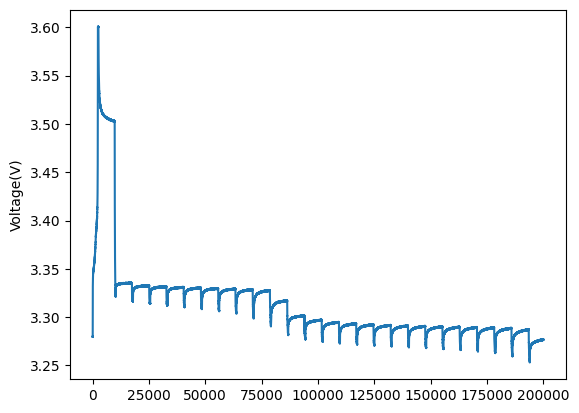

In [ ]:
sns.lineplot(df1.iloc[:200000,:]["Voltage(V)"])

In [ ]:
df1 = pd.read_csv("10degC_NN_Pan18650PF.csv").iloc[:,2:8]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)


In [ ]:
df1.columns = ["V", "C", "Ah", "Wh", "P", "T", "time_ind"]

In [ ]:
df1 = df1.iloc[3000:6000,:]
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|C|Ah|Wh|P|T", window = 150)

In [ ]:
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 100)

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

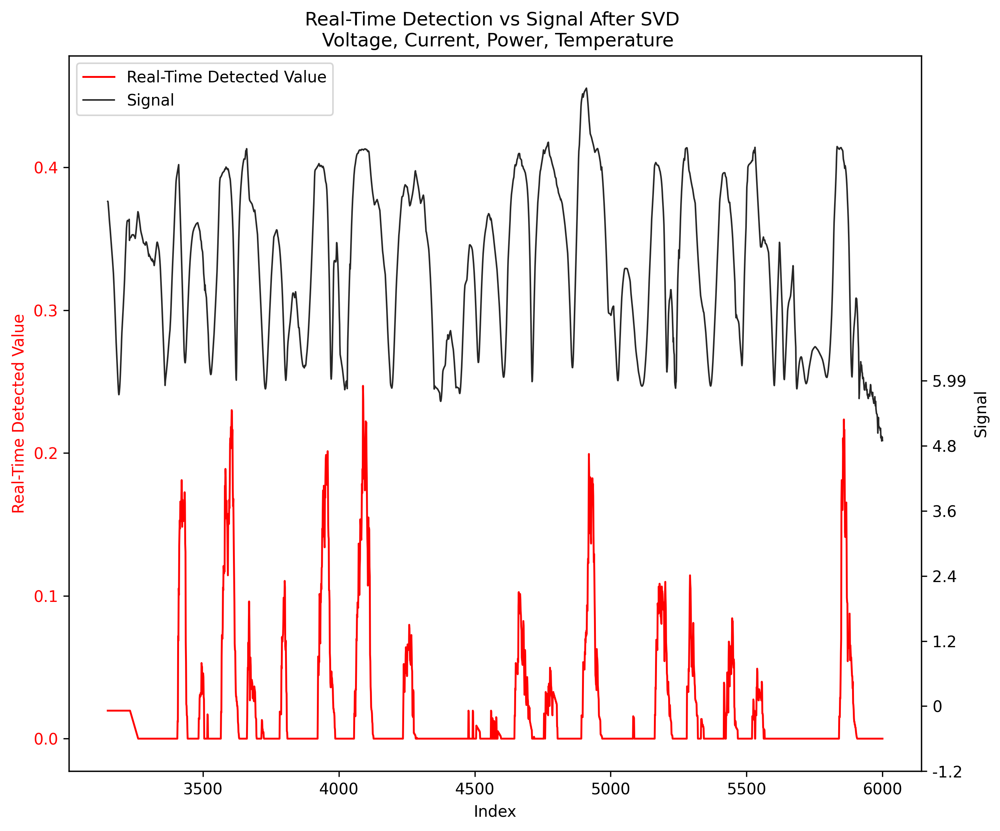

In [ ]:
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature")

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - HWFET Pan18650PF'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

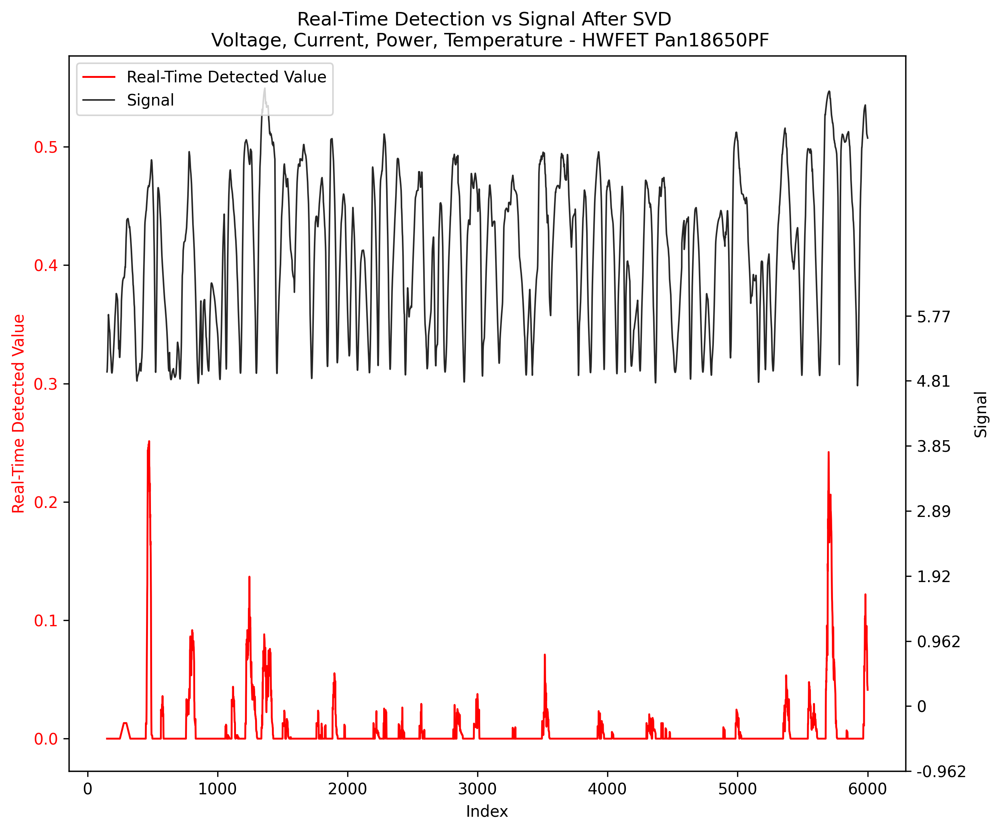

In [ ]:
df1 = pd.read_csv("10degC_HWFET_Pan18650PF.csv").iloc[2500:8000,2:8]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df1.columns = ["V", "C", "Ah", "Wh", "P", "T", "time_ind"]
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|C|Ah|Wh|P|T", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - HWFET Pan18650PF")

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - LA92 Pan18650PF'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

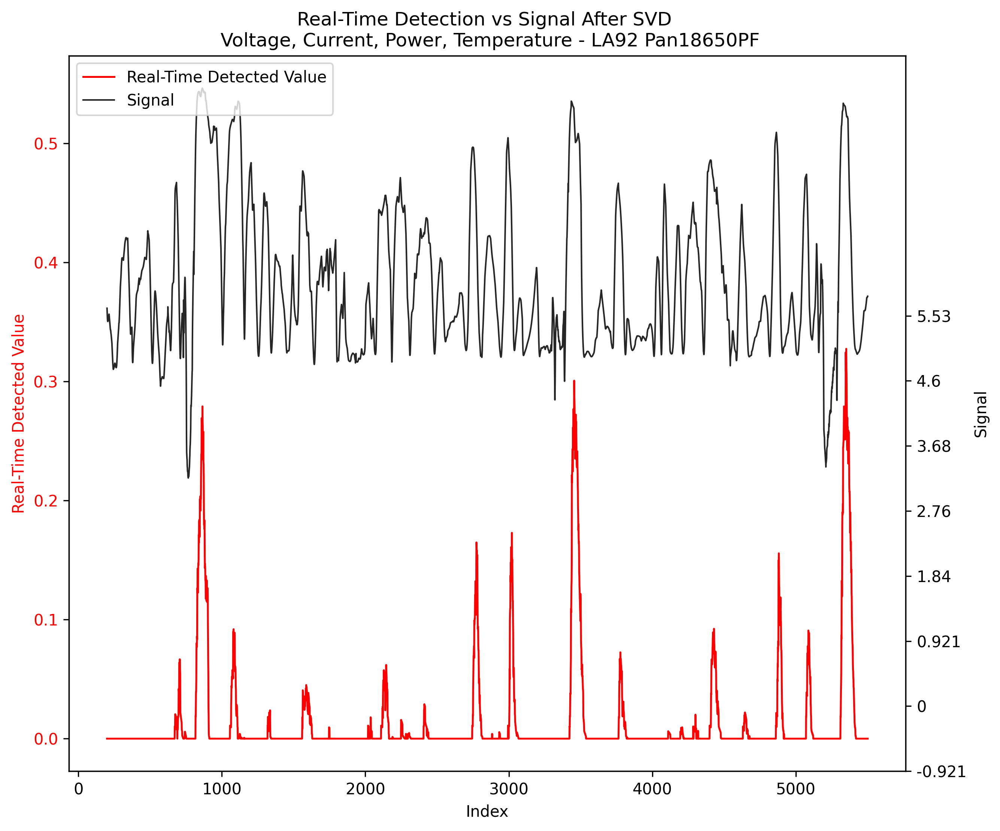

In [ ]:
#df1 = pd.read_csv("10degC_LA92_Pan18650PF.csv").iloc[2500:8000,2:8]
#df1["time_ind"] = np.arange(1, df1.shape[0]+1)
#df1.columns = ["V", "C", "Ah", "Wh", "P", "T", "time_ind"]
#df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|C|Ah|Wh|P|T", window = 200)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 60, highwl = 150)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - LA92 Pan18650PF")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - US06 Pan18650PF'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

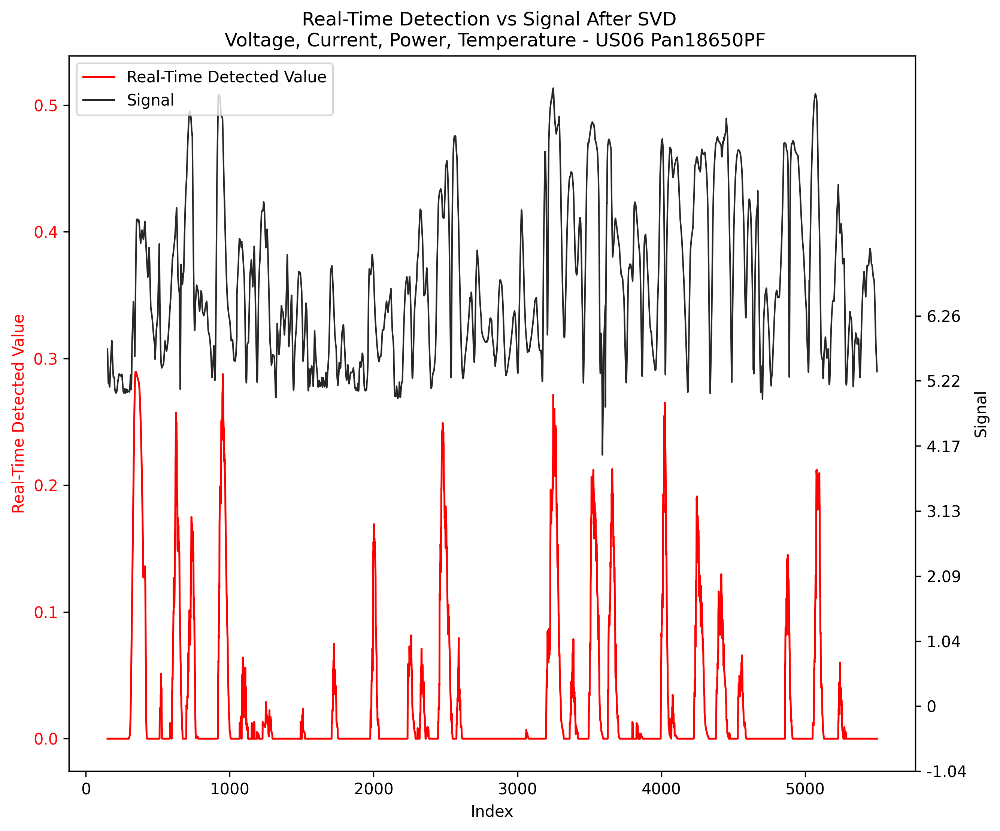

In [ ]:
df1 = pd.read_csv("10degC_US06_Pan18650PF.csv").iloc[2500:8000,2:8]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df1.columns = ["V", "C", "Ah", "Wh", "P", "T", "time_ind"]
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|C|Ah|Wh|P|T", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - US06 Pan18650PF")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - 10Deg Cycle1 Pan18650PF'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

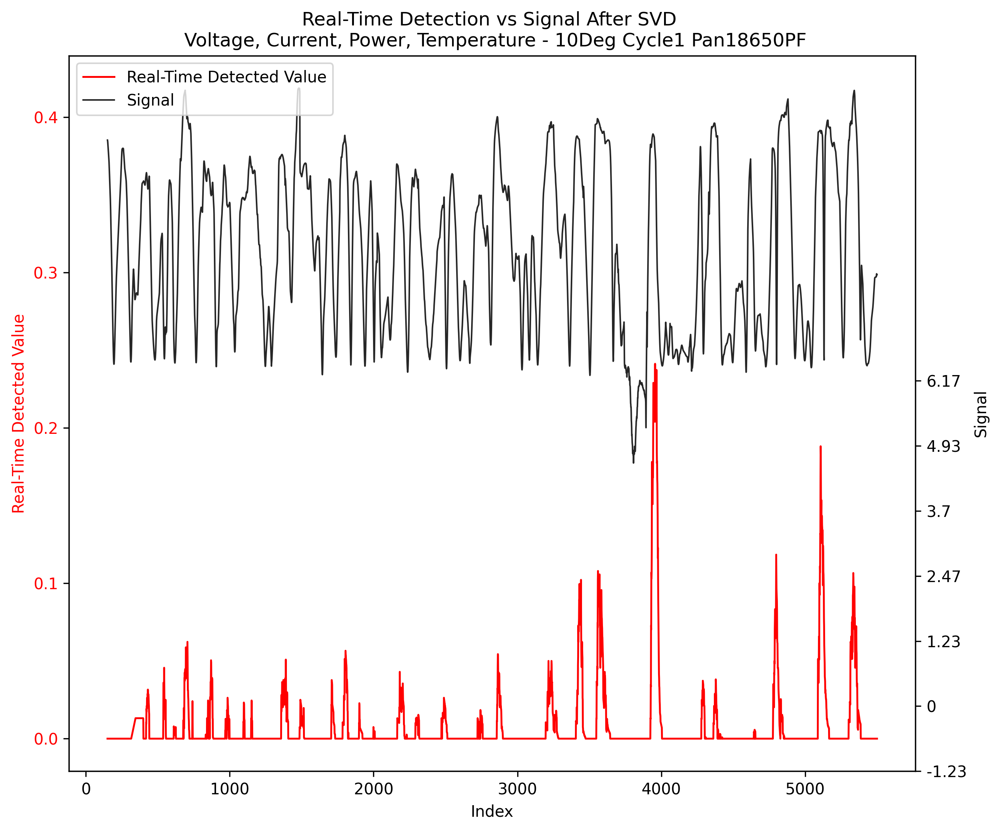

In [ ]:
df1 = pd.read_csv("10degC_Cycle_1_Pan18650PF.csv").iloc[2500:8000,2:8]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df1.columns = ["V", "C", "Ah", "Wh", "P", "T", "time_ind"]
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|C|Ah|Wh|P|T", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - 10Deg Cycle1 Pan18650PF")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - 10Deg Cycle3 Pan18650PF'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

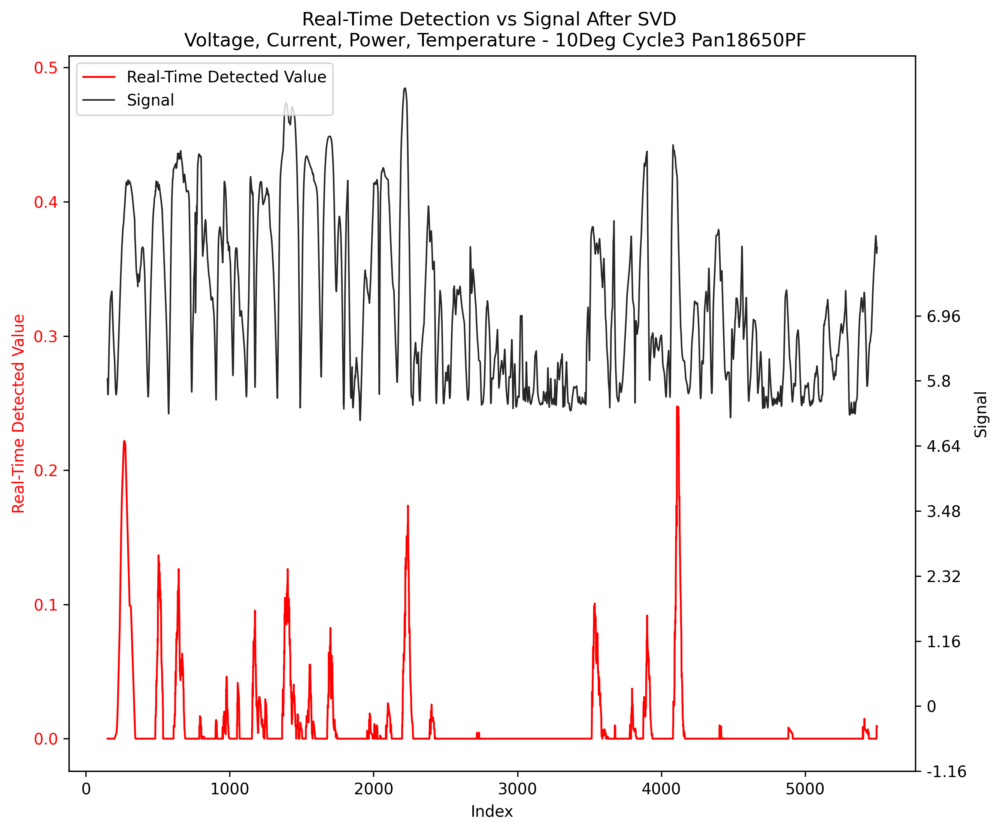

In [ ]:
#df1 = pd.read_csv("10degC_Cycle_3_Pan18650PF.csv").iloc[2500:8000,2:8]
#df1["time_ind"] = np.arange(1, df1.shape[0]+1)
#df1.columns = ["V", "C", "Ah", "Wh", "P", "T", "time_ind"]
#df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|C|Ah|Wh|P|T", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 150)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Power, Temperature - 10Deg Cycle3 Pan18650PF")


In [ ]:
df = pd.read_csv("discharge.csv").iloc[:, :7]
df.columns = ["V", "I", "T", "I_C", "V_C", "T", "Capacity"]

In [ ]:
df.head(5)

,V,I,T,I_C,V_C,T,Capacity
0,3.974871,-2.012528,24.389085,1.9982,3.062,35.703,1.856487
1,3.951717,-2.013979,24.544752,1.9982,3.030,53.781,1.856487
2,3.934352,-2.011144,24.731385,1.9982,3.011,71.922,1.856487
3,3.920058,-2.013007,24.909816,1.9982,2.991,90.094,1.856487
4,3.907904,-2.014400,25.105884,1.9982,2.977,108.281,1.856487


In [ ]:
df = pd.read_csv("discharge.csv").iloc[:10000, :7]
df.columns = ["V", "I", "T", "I_C", "V_C", "Time", "Capacity"]
df["time_ind"] = np.arange(1, df.shape[0]+1)

In [ ]:
df.head(5)

,V,I,T,I_C,V_C,Time,Capacity,time_ind
0,3.974871,-2.012528,24.389085,1.9982,3.062,35.703,1.856487,1
1,3.951717,-2.013979,24.544752,1.9982,3.030,53.781,1.856487,2
2,3.934352,-2.011144,24.731385,1.9982,3.011,71.922,1.856487,3
3,3.920058,-2.013007,24.909816,1.9982,2.991,90.094,1.856487,4
4,3.907904,-2.014400,25.105884,1.9982,2.977,108.281,1.856487,5


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Capacity, Charging Behaviors - Discharging Data'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

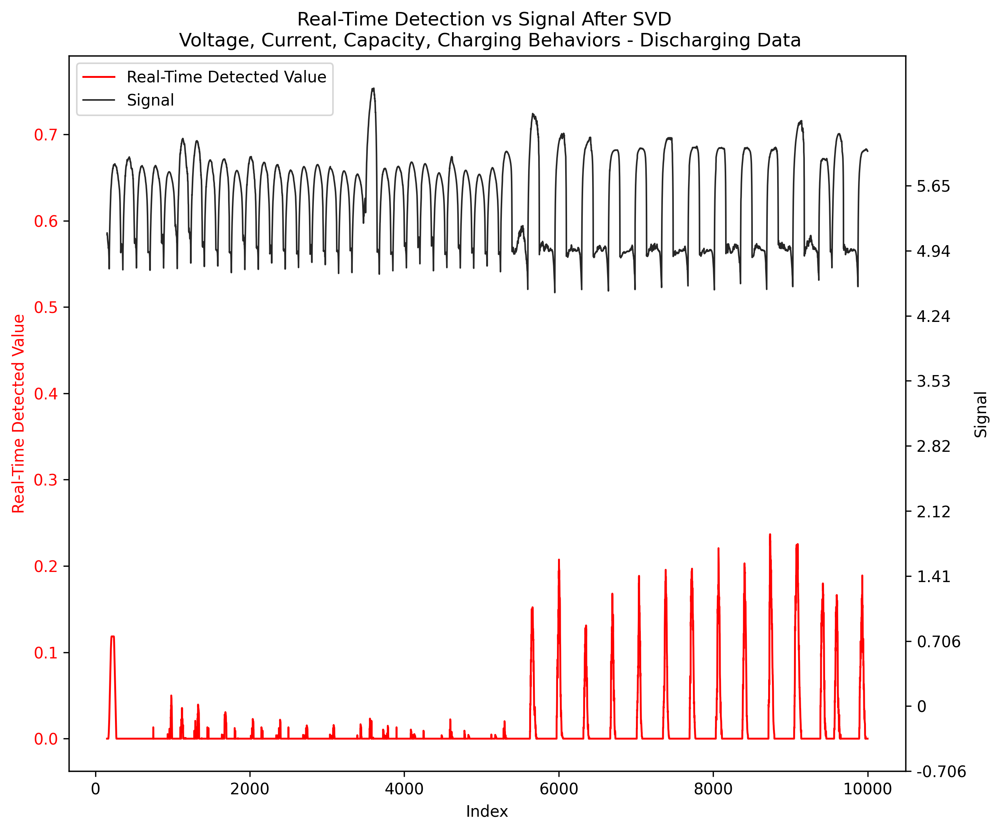

In [ ]:
df = pd.read_csv("discharge.csv").iloc[:10000, :7]
df.columns = ["V", "I", "T", "I_C", "V_C", "Time", "Capacity"]
df["time_ind"] = np.arange(1, df.shape[0]+1)
df_svd = build_signal_svd(df, time = "time_ind", x_cols = "V|I|T|I_C|V_C|Capacity", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Capacity, Charging Behaviors - Discharging Data")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Capacity, Charging Behaviors - Discharging Data, later Cycles'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

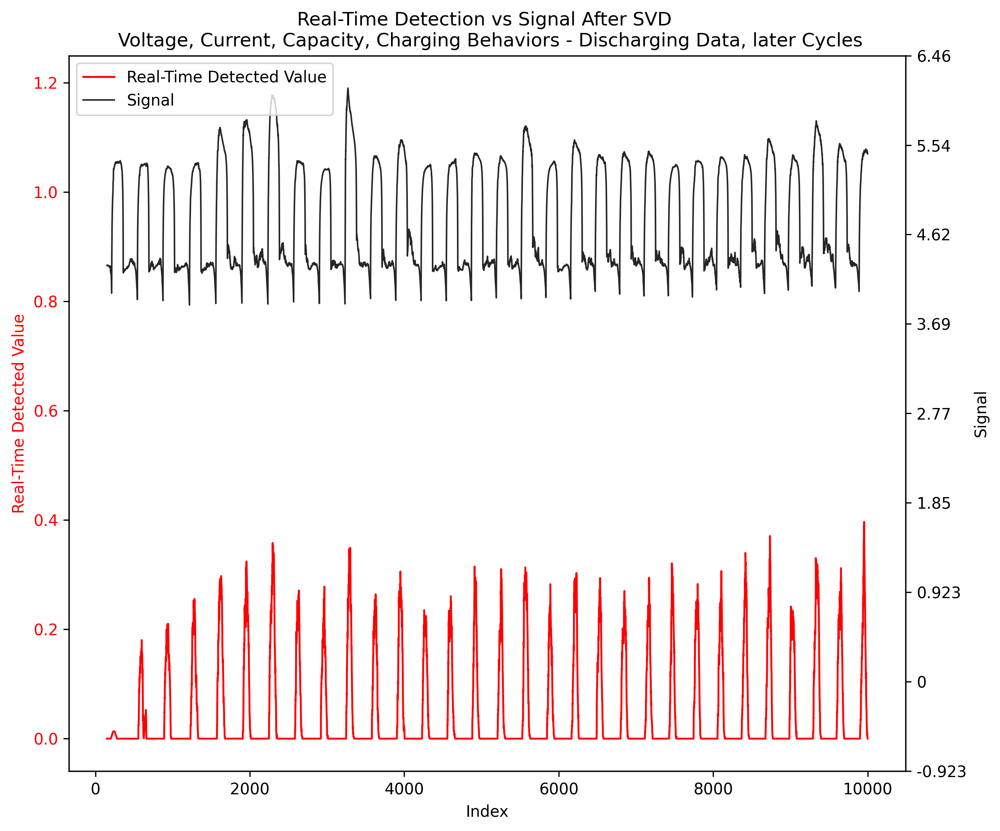

In [ ]:
df = pd.read_csv("discharge.csv").iloc[10000:20000, :7]
df.columns = ["V", "I", "T", "I_C", "V_C", "Time", "Capacity"]
df["time_ind"] = np.arange(1, df.shape[0]+1)
df_svd = build_signal_svd(df, time = "time_ind", x_cols = "V|I|T|I_C|V_C|Capacity", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Capacity, Charging Behaviors - Discharging Data, later Cycles")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Voltage, Current, Capacity, Charging Behaviors - Discharging Data, Latest Cycles'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

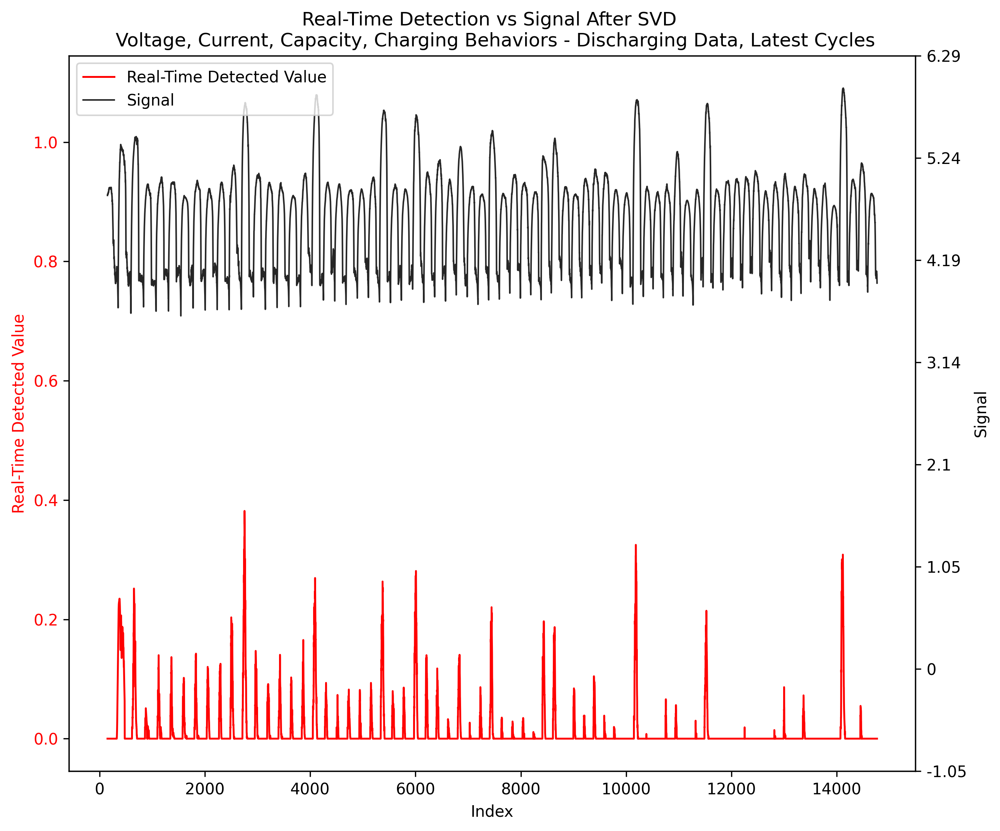

In [ ]:
#df = pd.read_csv("discharge.csv").iloc[155000:, :7]
#df.columns = ["V", "I", "T", "I_C", "V_C", "Time", "Capacity"]
#df["time_ind"] = np.arange(1, df.shape[0]+1)
df_svd = build_signal_svd(df, time = "time_ind", x_cols = "V|I|T|I_C|V_C|Capacity", window = 150)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 100)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Voltage, Current, Capacity, Charging Behaviors - Discharging Data, Latest Cycles")


In [ ]:
import scipy.io as sio

In [ ]:
df_svd = build_signal_svd(df1.iloc[1000:8000,:], time = "time_ind", x_cols = "Voltage_V|Current_A|T_center_degC|T_edge_degC|Force_N", window = 150)

In [ ]:
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 100)

Streaming output truncated to the last 5000 lines.
1851
1852
1853
1854
1855
1856
1857
1858
1859
1860
1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal SVD'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

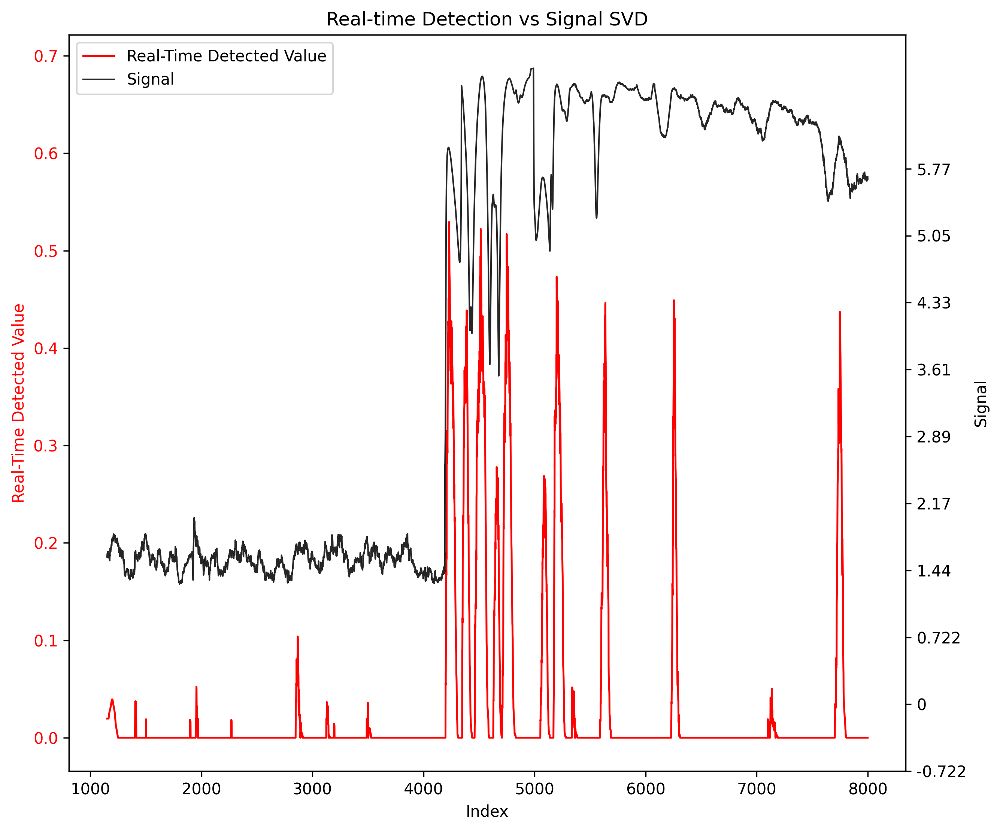

In [ ]:
plot_detection_overlay(df_detect)

In [ ]:
df1 = pd.read_csv("ESC_100ASOC.csv")
df1["time_ind"] = np.arange(1, df1.shape[0]+1)



In [ ]:
df1.head(5)

,Time_s,Voltage_V,Current_A,T_center_degC,T_edge_degC,Force_N,CO2_ppm,time_ind
0,0.000,4.176291,0.805064,24.723831,25.310993,140.091678,479,1
1,0.100,4.176331,0.864837,24.743586,25.291261,139.774158,479,2
2,0.200,4.176291,0.840928,24.743586,25.301127,139.678902,479,3
3,0.307,4.176371,0.821004,24.723831,25.281394,140.218686,479,4
4,0.407,4.176291,0.848897,24.723831,25.301127,139.551894,479,5


In [ ]:
df_s = build_signal_raw(df1, "time_ind", "T_edge_degC")

In [ ]:
df_s = df_s.iloc[500:5500, :]

In [ ]:
def plot_detection_overlay(
    df: pd.DataFrame,
    title: str = "Real-time Detection vs Signal after SVD \n Temperature, Current, Voltage",
    time_col: str = "time_ind",
    score_col: str = "detected_value_rt",
    signal_col: str = "signal",
    first_det_col: str = "first_detection_time",
    score_label: str = "Real-Time Detected Value",
    signal_label: str = "Signal",
    x_label: str = "Index",
    threshold: Optional[float] = None,
    scale_factor: Optional[float] = None,
    score_color: str = "red",
    signal_color: str = "black",
    save_path: Optional[str] = None,
    width: float = 9,
    height: float = 7.5,
    dpi: int = 300,
):
    """
    Overlay real-time detection score and signal with threshold & first-crossing.

    Creates a dual-axis plot with detection score (left y-axis) and the (optionally
    scaled) signal plotted on the same axis but labeled on the right in original units.
    """
    df_local = df.copy()

    x = df_local[time_col].to_numpy()
    sc = pd.to_numeric(df_local[score_col], errors="coerce").to_numpy()
    sg = pd.to_numeric(df_local[signal_col], errors="coerce").to_numpy()

    # Auto scale the signal onto the left axis range; right axis shows original via secondary label.
    if scale_factor is None:
        rng_sc = (np.nanmin(sc), np.nanmax(sc))
        rng_sg = (np.nanmin(sg), np.nanmax(sg))
        span_sc = rng_sc[1] - rng_sc[0]
        span_sg = rng_sg[1] - rng_sg[0]
        if not np.isfinite(span_sc) or span_sc == 0 or not np.isfinite(span_sg) or span_sg == 0:
            alpha = 1.0
        else:
            alpha = float(span_sc / span_sg)
    else:
        alpha = float(scale_factor) if np.isfinite(scale_factor) and scale_factor != 0 else 1.0

    scaled_signal = sg * alpha

    # First detection time: constant across rows (may be NaN/None)
    first_det_time = None
    if first_det_col in df_local.columns:
        vals = df_local[first_det_col].unique()
        # Filter finite-like entries (works for numeric and datetime64; keep non-numeric non-null too)
        cleaned = []
        for v in vals:
            if pd.isna(v):
                continue
            cleaned.append(v)
        if cleaned:
            first_det_time = cleaned[0]

    # Build plot
    fig, ax1 = plt.subplots(figsize=(width, height), dpi=dpi)

    # Score on left axis
    ax1.plot(x, sc, color=score_color, linewidth=1.2, label=score_label)
    ax1.set_ylabel(score_label, color=score_color)
    ax1.tick_params(axis='y', labelcolor=score_color)

    # Scaled signal on same axis (plotted to match scale), with right-axis label in original units
    ax1.plot(x, scaled_signal, color=signal_color, linewidth=1.0, alpha=0.85, label=signal_label)

    # Threshold (horizontal) on score axis
    if threshold is not None and np.isfinite(threshold):
        ax1.axhline(y=threshold, linestyle="--", color=score_color, linewidth=0.9)

    # First detection time (vertical)
    if first_det_time is not None:
        ax1.axvline(x=first_det_time, linestyle=":", color="steelblue", linewidth=1.0)

    ax1.set_xlabel(x_label)
    ax1.set_title(title)

    # Secondary y-axis label to indicate original signal scale
    ax2 = ax1.twinx()
    ax2.set_ylabel(signal_label, color=signal_color)
    ax2.tick_params(axis='y', labelcolor=signal_color)

    # Sync right-axis ticks to represent original units
    # y_left = alpha * signal  => signal = y_left / alpha
    left_ticks = ax1.get_yticks()
    ax2.set_yticks(left_ticks)
    ax2.set_yticklabels([f"{(yt / alpha):.3g}" for yt in left_ticks])

    # Simple legend
    lines = ax1.get_lines()
    labels = [score_label, signal_label]
    ax1.legend(lines[:2], labels, loc="upper left")

    plt.tight_layout()

    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")

    return fig, ax1, ax2

In [ ]:
df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 30, highwl = 150)

150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal SVD'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

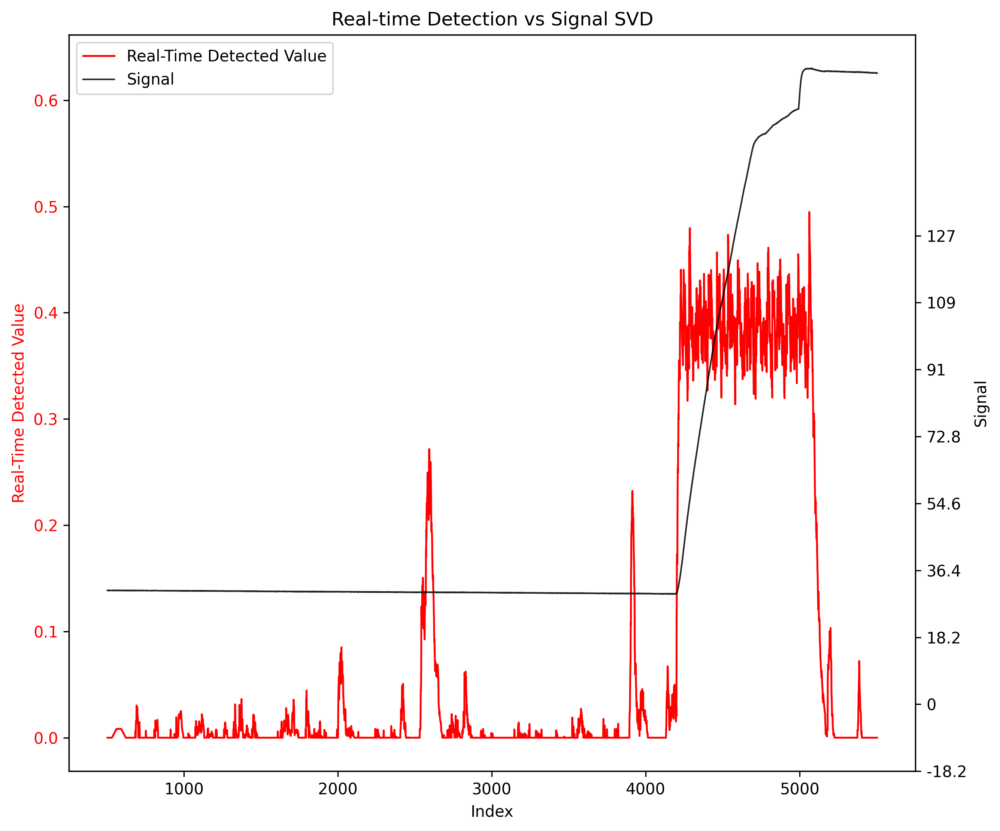

In [ ]:
plot_detection_overlay(df_detect)

<Axes: ylabel='T_center_degC'>

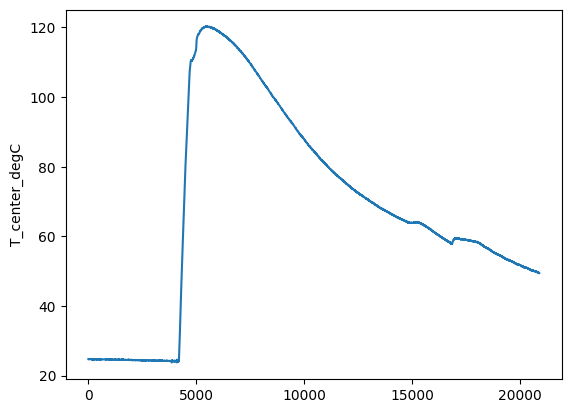

In [ ]:
import seaborn as sns
sns.lineplot(df1["T_center_degC"])

In [ ]:
df1 = pd.read_csv("mat_charging_result1.csv")
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df1 = df1.iloc[:30000,:]

In [ ]:
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df1 = df1.iloc[1:30000,:]

<Axes: ylabel='T'>

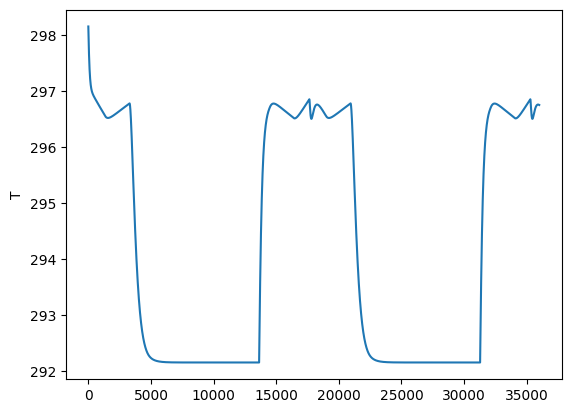

In [ ]:
import seaborn as sns
sns.lineplot(df1["T"])

In [ ]:
df1.head(5)

,T,Q1,S1,IT,V,time_ind
1,298.139136,3.051465,5.989136,15.0,3.780005,2
2,298.128328,3.045958,5.978328,15.0,3.780423,3
3,298.117577,3.040480,5.967577,15.0,3.780835,4
4,298.106884,3.035032,5.956884,15.0,3.781244,5
5,298.096249,3.029614,5.946249,15.0,3.781647,6


In [ ]:
df1.shape

(29999, 6)

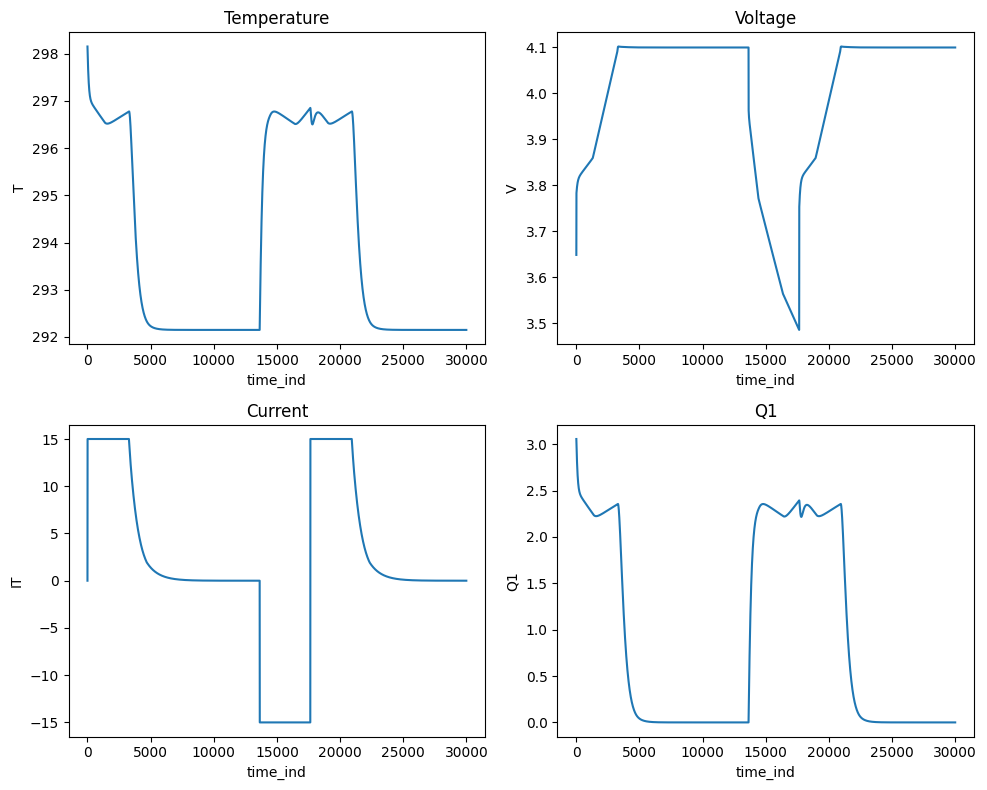

In [ ]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

sns.lineplot(data = df1, x = "time_ind", y = "T", ax=axes[0, 0])
axes[0, 0].set_title("Temperature")

sns.lineplot(data = df1, x = "time_ind", y = "V", ax=axes[0, 1])
axes[0, 1].set_title("Voltage")

sns.lineplot(data = df1, x = "time_ind", y = "IT", ax=axes[1, 0])
axes[1, 0].set_title("Current")

sns.lineplot(data = df1, x = "time_ind", y = "Q1", ax=axes[1, 1])
axes[1, 1].set_title("Q1")

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the figure
plt.show()

In [ ]:
df1 = df1.iloc[10000:17000,:]

In [ ]:
#Conduct real-time prediction on the temperature:
df1["time_ind"] = np.arange(1, df1.shape[0]+1)

In [ ]:
df1 = df1.iloc[8000:20000,:]
df_s = build_signal_raw(df1, "time_ind", "T")

In [ ]:
df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 120, highwl = 200)

Streaming output truncated to the last 5000 lines.
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7152
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189

<Axes: ylabel='detected_value_rt'>

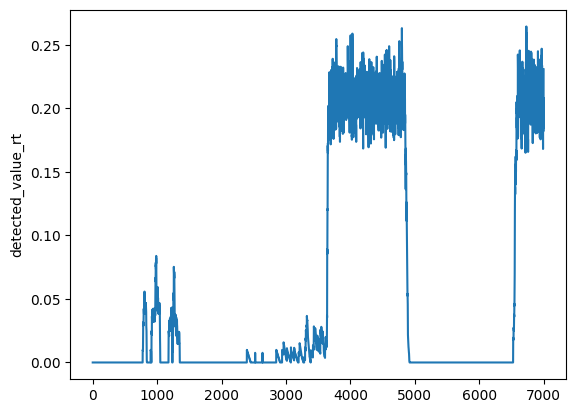

In [ ]:
sns.lineplot(df_detect["detected_value_rt"])

In [ ]:
df1.columns

Index(['T', 'Q1', 'S1', 'IT', 'V', 'time_ind'], dtype='object')

In [ ]:
df2 = build_signal_arimax_svd(df1, time = "time_ind", y_cols = "T|Q1|S1|V", xreg_cols = "IT", window = 150)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
df2.columns

Index(['time_ind', 'signal'], dtype='object')

In [ ]:
df2.to_csv("charging_after_svd.csv")

In [ ]:
df_detect.to_csv("charging_df_detect.csv")

In [ ]:
df_detect = detect_realtime(df2["time_ind"], df2["signal"], lowwl = 120, highwl = 200)

Streaming output truncated to the last 5000 lines.
12348
12349
12350
12351
12352
12353
12354
12355
12356
12357
12358
12359
12360
12361
12362
12363
12364
12365
12366
12367
12368
12369
12370
12371
12372
12373
12374
12375
12376
12377
12378
12379
12380
12381
12382
12383
12384
12385
12386
12387
12388
12389
12390
12391
12392
12393
12394
12395
12396
12397
12398
12399
12400
12401
12402
12403
12404
12405
12406
12407
12408
12409
12410
12411
12412
12413
12414
12415
12416
12417
12418
12419
12420
12421
12422
12423
12424
12425
12426
12427
12428
12429
12430
12431
12432
12433
12434
12435
12436
12437
12438
12439
12440
12441
12442
12443
12444
12445
12446
12447
12448
12449
12450
12451
12452
12453
12454
12455
12456
12457
12458
12459
12460
12461
12462
12463
12464
12465
12466
12467
12468
12469
12470
12471
12472
12473
12474
12475
12476
12477
12478
12479
12480
12481
12482
12483
12484
12485
12486
12487
12488
12489
12490
12491
12492
12493
12494
12495
12496
12497
12498
12499
12500
12501
12502
12503
12504
12505
1

In [ ]:
df_detect.to_csv("charging_df_detect.csv")

(array([1.5383e+04, 6.2600e+02, 6.7100e+02, 4.7500e+02, 1.7000e+01,
        1.1000e+01, 1.0000e+01, 1.1000e+01, 1.4000e+01, 1.3000e+02]),
 array([0.        , 0.06049383, 0.12098765, 0.18148148, 0.24197531,
        0.30246914, 0.36296296, 0.42345679, 0.48395062, 0.54444444,
        0.60493827]),
 <BarContainer object of 10 artists>)

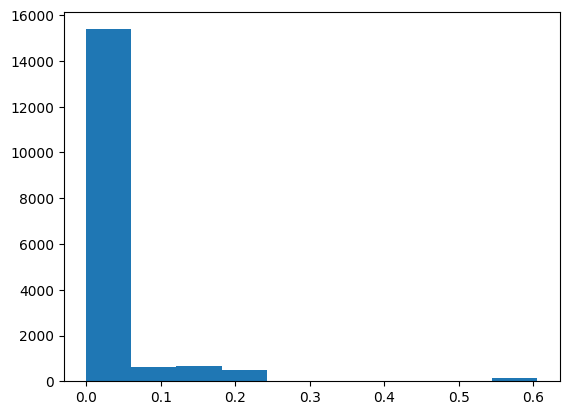

In [ ]:
plt.hist(df_detect["detected_value_rt"])

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

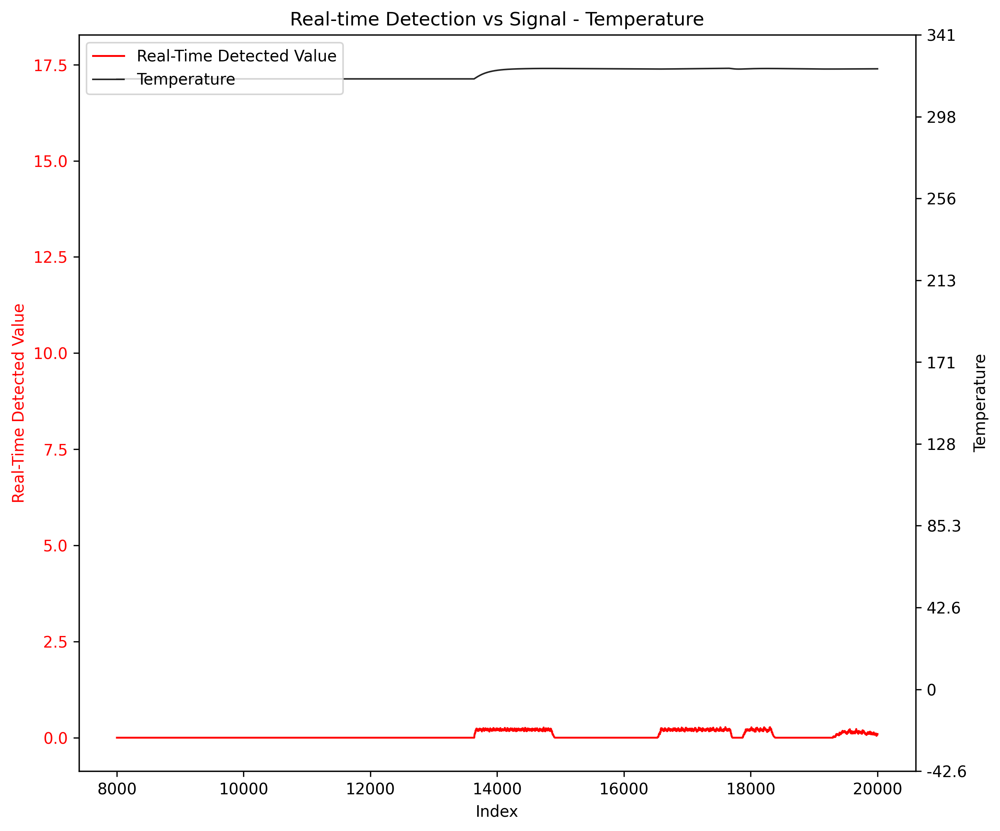

In [ ]:
plot_detection_overlay(df_detect)

In [ ]:
def plot_detection_overlay(
    df: pd.DataFrame,
    title: str = "Real-time Detection vs Signal - Temperature",
    time_col: str = "time_ind",
    score_col: str = "detected_value_rt",
    signal_col: str = "signal",
    first_det_col: str = "first_detection_time",
    score_label: str = "Real-Time Detected Value",
    signal_label: str = "Temperature",
    x_label: str = "Index",
    threshold: Optional[float] = None,
    scale_factor: Optional[float] = None,
    score_color: str = "red",
    signal_color: str = "black",
    save_path: Optional[str] = None,
    width: float = 9,
    height: float = 7.5,
    dpi: int = 300,
):
    """
    Overlay real-time detection score and signal with threshold & first-crossing.

    Creates a dual-axis plot with detection score (left y-axis) and the (optionally
    scaled) signal plotted on the same axis but labeled on the right in original units.
    """
    df_local = df.copy()

    x = df_local[time_col].to_numpy()
    sc = pd.to_numeric(df_local[score_col], errors="coerce").to_numpy()
    sg = pd.to_numeric(df_local[signal_col], errors="coerce").to_numpy()

    # Auto scale the signal onto the left axis range; right axis shows original via secondary label.
    if scale_factor is None:
        rng_sc = (np.nanmin(sc), np.nanmax(sc))
        rng_sg = (np.nanmin(sg), np.nanmax(sg))
        span_sc = rng_sc[1] - rng_sc[0]
        span_sg = rng_sg[1] - rng_sg[0]
        if not np.isfinite(span_sc) or span_sc == 0 or not np.isfinite(span_sg) or span_sg == 0:
            alpha = 1.0
        else:
            alpha = float(span_sc / span_sg)
    else:
        alpha = float(scale_factor) if np.isfinite(scale_factor) and scale_factor != 0 else 1.0

    scaled_signal = sg * alpha

    # First detection time: constant across rows (may be NaN/None)
    first_det_time = None
    if first_det_col in df_local.columns:
        vals = df_local[first_det_col].unique()
        # Filter finite-like entries (works for numeric and datetime64; keep non-numeric non-null too)
        cleaned = []
        for v in vals:
            if pd.isna(v):
                continue
            cleaned.append(v)
        if cleaned:
            first_det_time = cleaned[0]

    # Build plot
    fig, ax1 = plt.subplots(figsize=(width, height), dpi=dpi)

    # Score on left axis
    ax1.plot(x, sc, color=score_color, linewidth=1.2, label=score_label)
    ax1.set_ylabel(score_label, color=score_color)
    ax1.tick_params(axis='y', labelcolor=score_color)
    ax1.set_ylim(0,1)

    # Scaled signal on same axis (plotted to match scale), with right-axis label in original units
    ax1.plot(x, scaled_signal, color=signal_color, linewidth=1.0, alpha=0.85, label=signal_label)

    # Threshold (horizontal) on score axis
    if threshold is not None and np.isfinite(threshold):
        ax1.axhline(y=threshold, linestyle="--", color=score_color, linewidth=0.9)

    # First detection time (vertical)
    if first_det_time is not None:
        ax1.axvline(x=first_det_time, linestyle=":", color="steelblue", linewidth=1.0)

    ax1.set_xlabel(x_label)
    ax1.set_title(title)

    # Secondary y-axis label to indicate original signal scale
    ax2 = ax1.twinx()
    ax2.set_ylabel(signal_label, color=signal_color)
    ax2.tick_params(axis='y', labelcolor=signal_color)
    ax2.set_ylim(min(sg), max(sg))

    # Sync right-axis ticks to represent original units
    # y_left = alpha * signal  => signal = y_left / alpha
    left_ticks = ax1.get_yticks()
    ax2.set_yticks(left_ticks)
    ax2.set_yticklabels([f"{(yt / alpha):.3g}" for yt in left_ticks])

    # Simple legend
    lines = ax1.get_lines()
    labels = [score_label, signal_label]
    ax1.legend(lines[:2], labels, loc="upper left")

    plt.tight_layout()

    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches="tight")

    return fig, ax1, ax2

In [ ]:
df_detect.to_csv("df_temperature_result.csv")

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

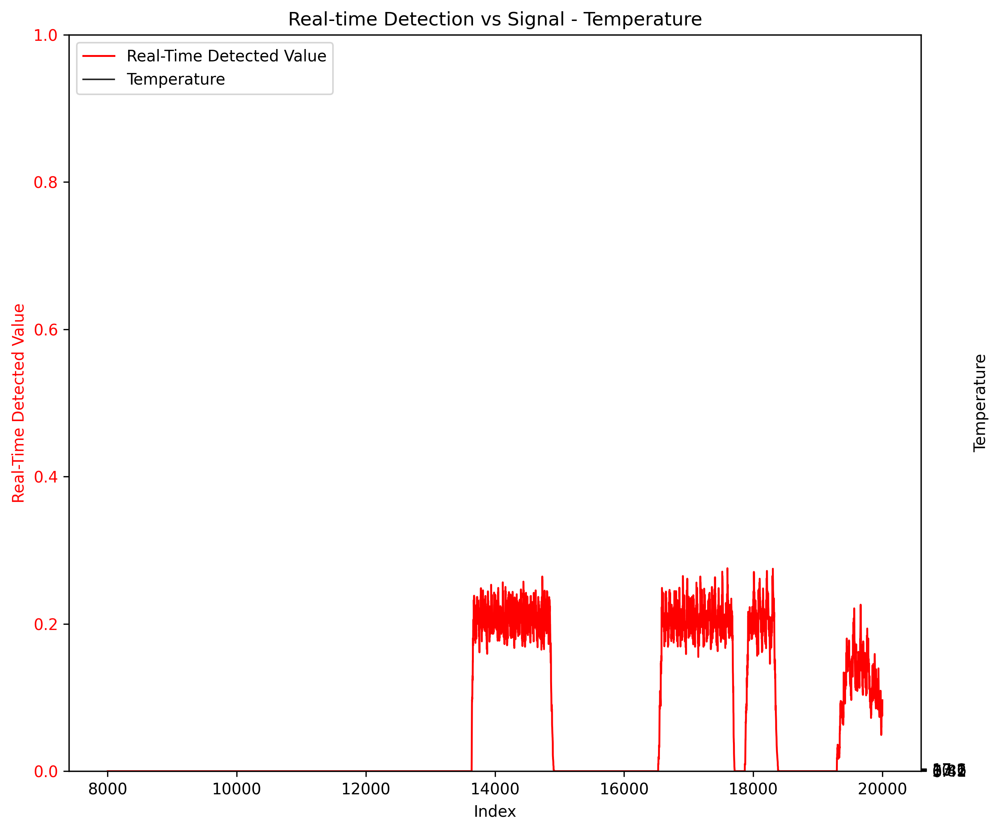

In [ ]:
plot_detection_overlay(df_detect)

In [ ]:
df4 = pd.read_csv("ISC_faulty8.csv")
df4.columns = {"I", "T", "V"}
df4 = df4.iloc[:2500, :]

150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature, ISC2'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

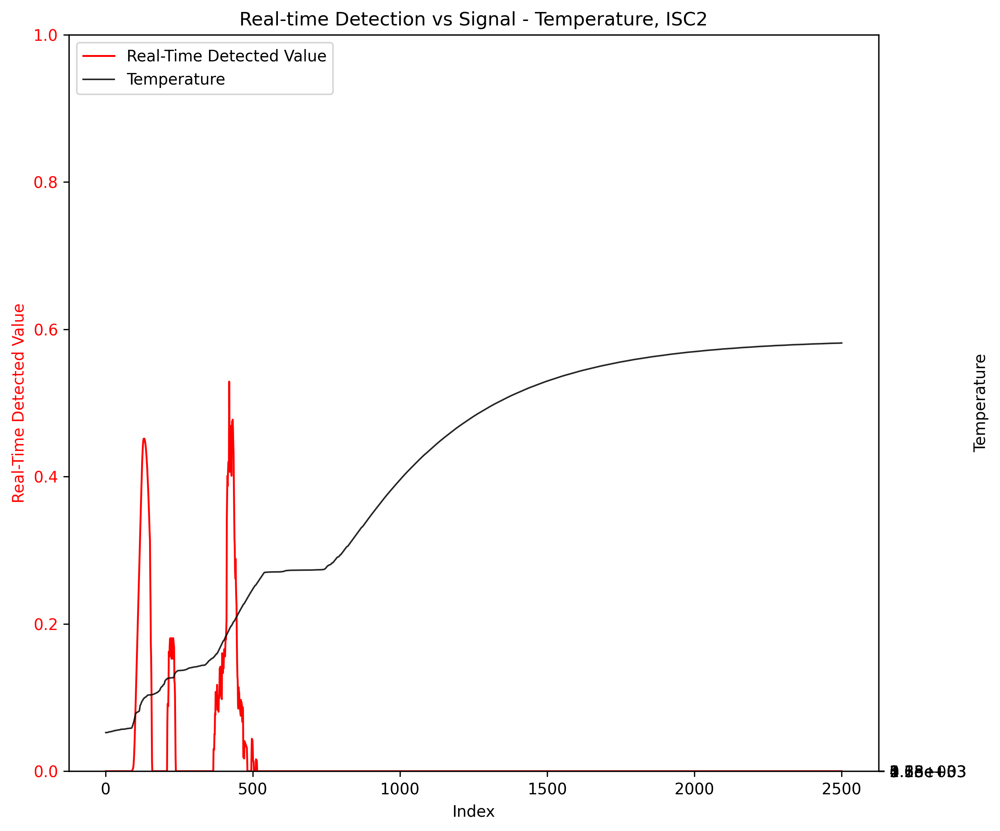

In [ ]:
df4["time_ind"] = np.arange(1, df4.shape[0]+1)
df_s = build_signal_raw(df4, "time_ind", "T")
df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 30, highwl = 60)
plot_detection_overlay(df_detect, title = "Real-time Detection vs Signal - Temperature, ISC2")

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature, ISC2'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

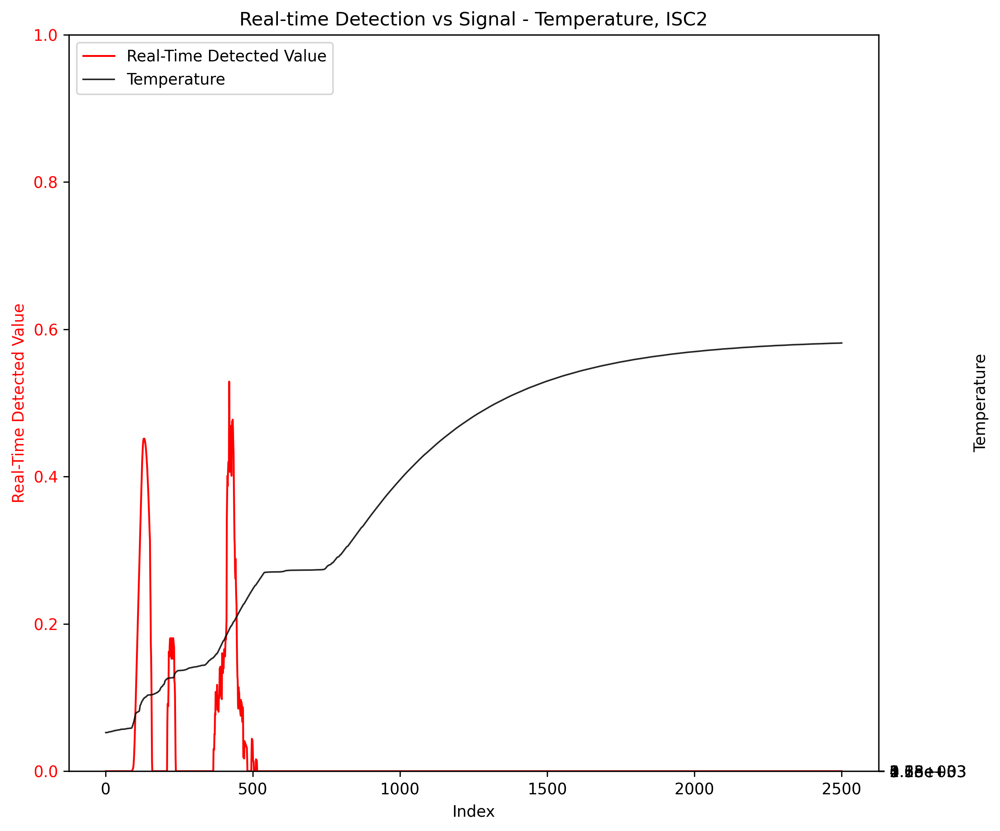

In [ ]:
plot_detection_overlay(df_detect, title = "Real-time Detection vs Signal - Temperature, ISC2")

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature, ISC2'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

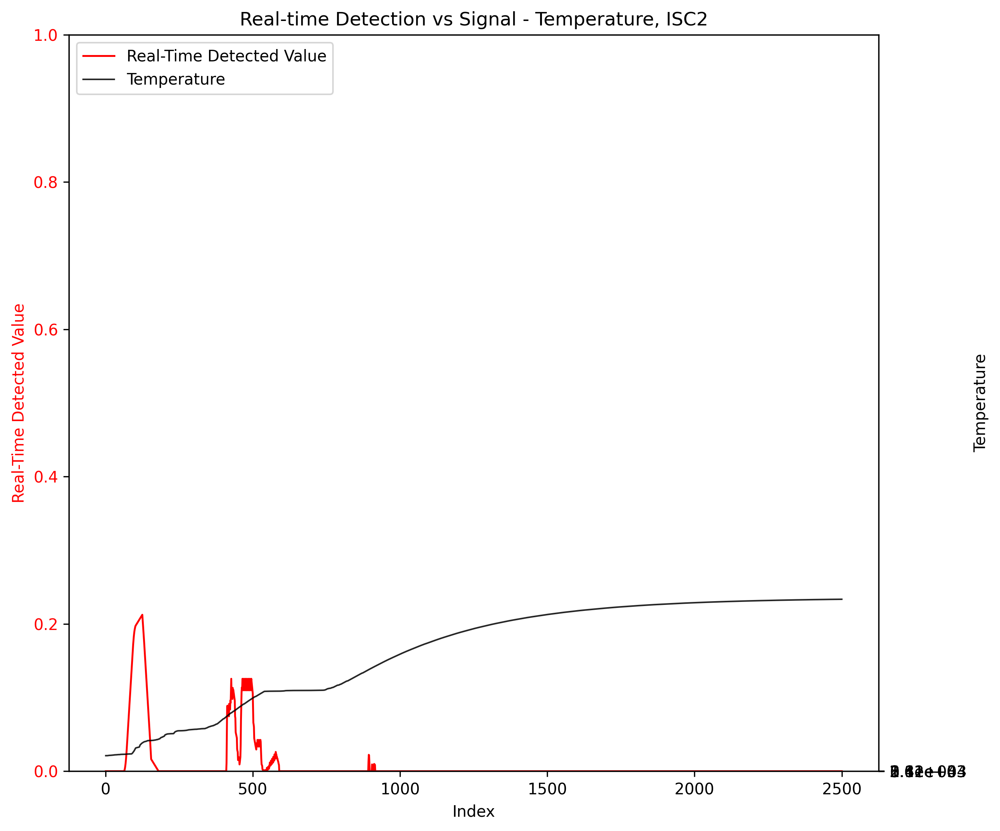

In [ ]:
plot_detection_overlay(df_detect, title = "Real-time Detection vs Signal - Temperature, ISC2")

In [ ]:
df4.columns

Index(['I', 'T', 'V', 'time_ind'], dtype='object')

In [ ]:
#df4["time_ind"] = np.arange(1, df4.shape[0]+1)
#df_s = build_signal_svd(df4, time = "time_ind", x_cols = "I|T|V", window = 25)
df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 10, highwl = 50)
plot_detection_overlay(df_detect, title = "Real-time Detection vs Signal - Temperature, Current, Voltage SVD - ISC2")

100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349


KeyboardInterrupt: 

In [ ]:
pip install pybamm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 847.1/847.1 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 5.3 MB/s eta 0:00:00


In [ ]:
import pybamm

In [ ]:
df5 = pd.read_csv("ISC_faulty10.csv")
df5.columns = {"I", "T", "V"}
df5 = df5.iloc[:2500, :]

125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature, ISC3'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

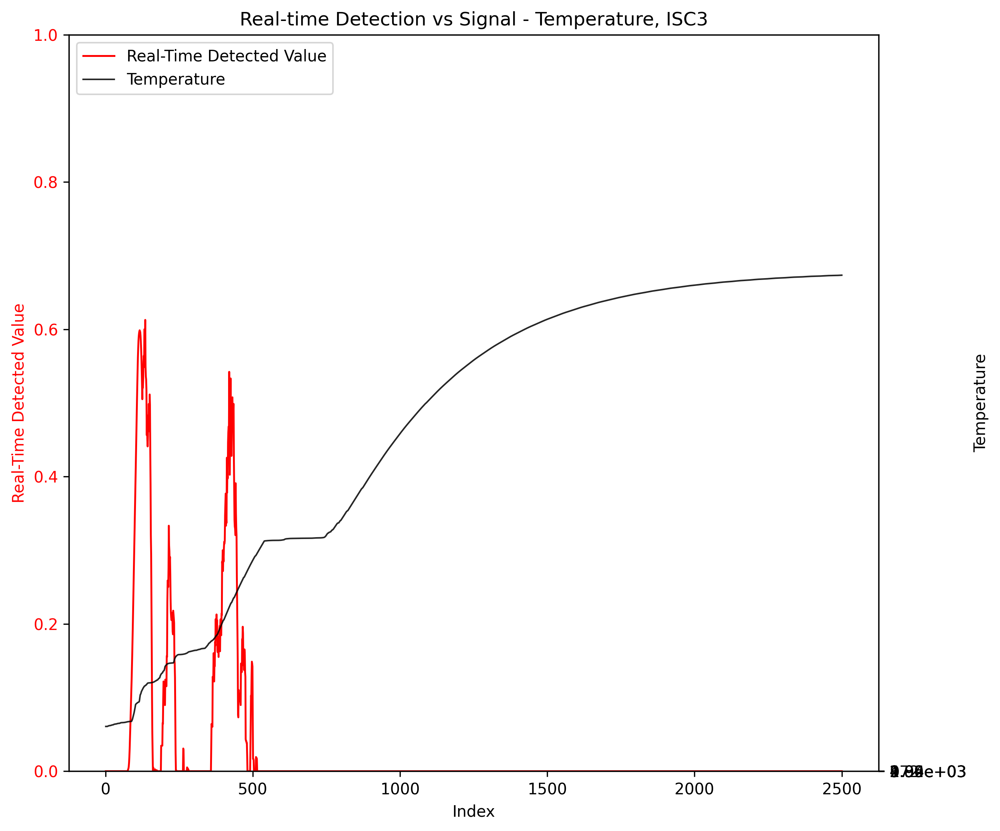

In [ ]:
df5["time_ind"] = np.arange(1, df5.shape[0]+1)
df_s = build_signal_raw(df5, "time_ind", "T")
df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 25, highwl = 50)
plot_detection_overlay(df_detect, title = "Real-time Detection vs Signal - Temperature, ISC3")

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-time Detection vs Signal - Temperature, Current, Voltage SVD - ISC3'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Temperature'>)

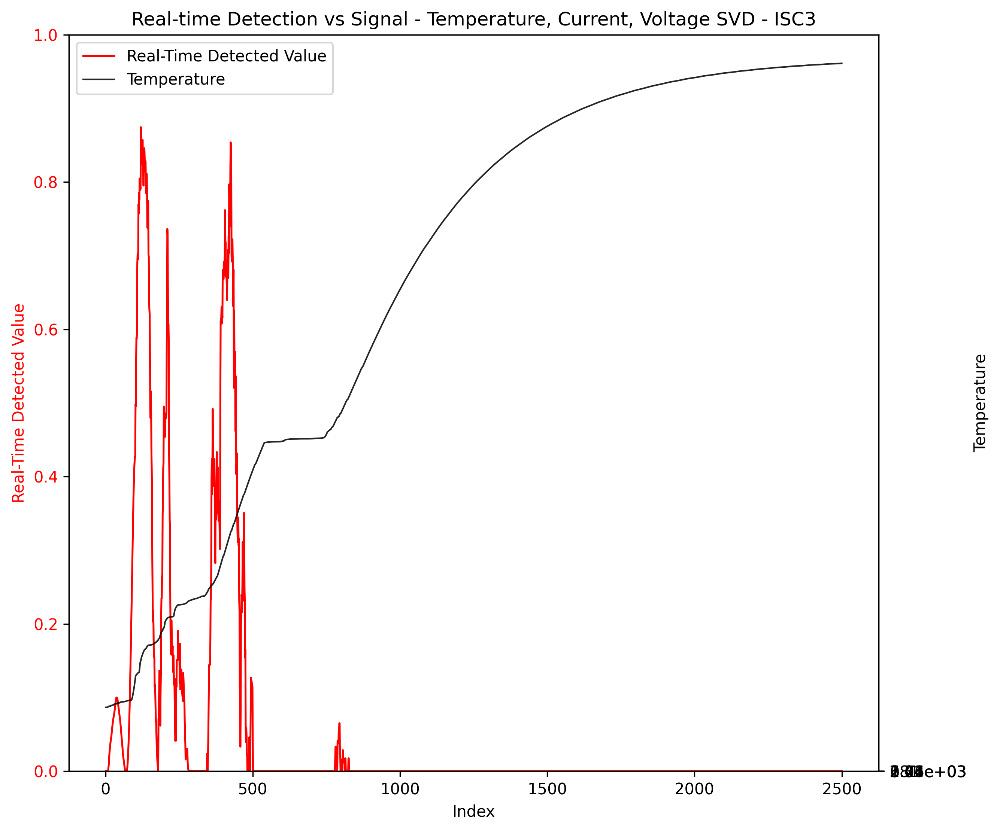

In [ ]:
#df_s = build_signal_svd(df5, time = "time_ind", x_cols = "I|T|V", window = 25)
#df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 10, highwl = 30)
plot_detection_overlay(df_detect, title = "Real-time Detection vs Signal - Temperature, Current, Voltage SVD - ISC3")

Utilizing PyBamm to simulate the thermal runaway introduced by a variety of sources:

In [ ]:
import pybamm

experiment = pybamm.Experiment(
    [
        (
            "Discharge at C/10 for 10 hours or until 3.3 V",
            "Rest for 1 hour",
            "Charge at 1 A until 4.1 V",
            "Hold at 4.1 V until 50 mA",
            "Rest for 1 hour",
        )
    ]
    * 3,
)
model = pybamm.lithium_ion.DFN()
sim = pybamm.Simulation(model, experiment=experiment)
sim.solve()
sim.plot()

interactive(children=(FloatSlider(value=0.0, description='t', max=38.908234479441994, step=0.38908234479441994…

In [ ]:
import sys
chemistry = pybamm.parameter_sets.Chen2020 #get battery chemistry
parameter_values = pybamm.ParameterValues(chemistry=chemistry) #put battery chemistry
model = pybamm.lithium_ion.SPMe() #set battery model
parameter_values["Ambient temperature [K]"] = c_to_k(20) #modify ambient temperature
parameter_values["Reference temperature [K]"] = c_to_k(20)
parameter_values["Initial temperature [K]"] = c_to_k(20)
data = get_data()# import expermintal data
rates = ["C/10", "C/2", "1C", "2C"] # define charge rates
for i in rates:
experiment = pybamm.Experiment(
[
f"Discharge at 1C until 2.7 V",
 "Hold at 3.4 V until 50 mA",
 "Rest for 30 minutes",
 f"Charge at {i} until 4.2 V",
 "Rest for 30 minutes",
 f"Discharge at {i} until 2.7 V"
 ] * 1
 )
 sim = pybamm.Simulation(model,experiment=experiment, parameter_values =
 parameter_values) # call on the pybamm package to run a simulation with our
 parameters
 sim.solve()
simdata[i] = sim

In [ ]:
options = {"thermal": "x-full"}
model = pybamm.lithium_ion.SPMe(options=options)
experiment = pybamm.Experiment( # details of battery cycling experiment below
[
"Discharge at 4C for 15 minutes or until 3.3 V",
 "Rest for 2 minutes",
 "Charge at 1C for 25 minutes or until 4.1 V",
 "Rest for 2 minutes",
 ] * 30
 )

In [ ]:
sim = pybamm.Simulation(model,experiment=experiment)
sim.solve()

In [ ]:
quick_plot_vars = ["Battery voltage [V]",'Volume-averaged cell temperature [K]',"Current [A]"]
sim.plot(quick_plot_vars)#This is battery degradation.. #pybamm

interactive(children=(FloatSlider(value=0.0, description='t', max=17.771646127431833, step=0.17771646127431834…

In [ ]:
sim.solution['Volume-averaged cell temperature [K]'].entries

array([298.15      , 298.1501465 , 298.15029067, ..., 400.3833627 ,
       400.36225808, 400.35173816])

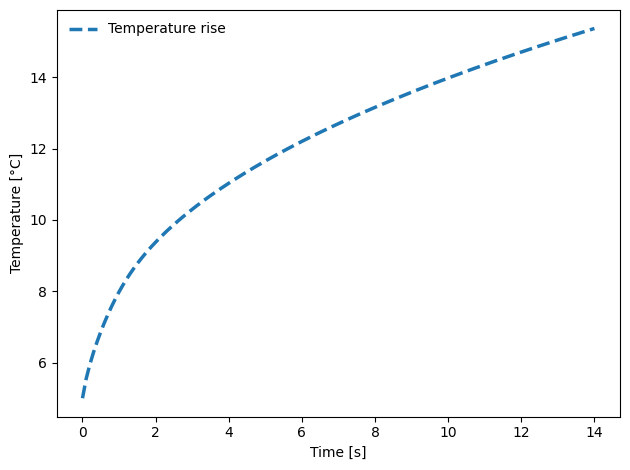

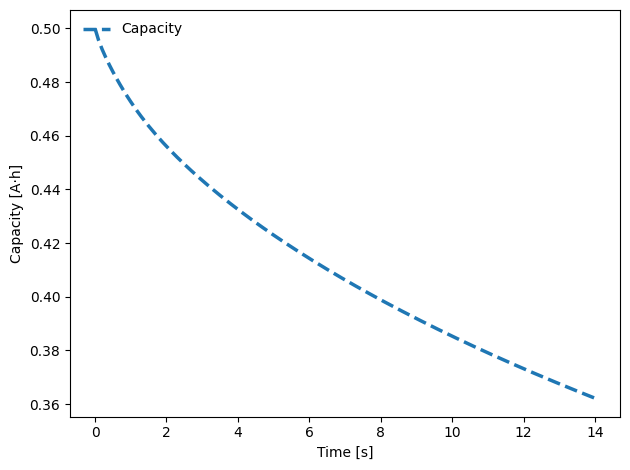

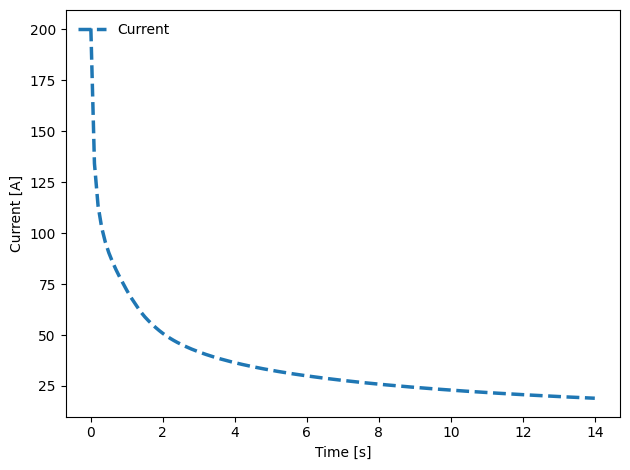

Data saved in: /content/ESC_Attachment_Output


In [ ]:

#!/usr/bin/env python3
"""
External short-circuit (ESC) hold step: DFN with lumped thermal.
Anonymised, reviewer-ready, British English comments and labels.
"""

import pybamm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

# -----------------------------
# Model definition & parameters
# -----------------------------
options = {"thermal": "lumped"}
param = pybamm.ParameterValues("OKane2022")
model = pybamm.lithium_ion.DFN(options)

# Initial / ambient temperature (in Kelvin)
initial_temperature_K = 278.15  # 5 °C
param.update({"Lower voltage cut-off [V]": 0.0})
param.update({"Initial temperature [K]": initial_temperature_K})

# -----------------------------------------------
# Experiment: hold at 1.75 V for a short period
# (Nominally 14 s here; adjust if required)
# -----------------------------------------------
experiment = pybamm.Experiment(
    [
        "Hold at 1.75 V for 14 seconds (0.1 second period)",
    ]
)

# -----------------
# Solver & meshes
# -----------------
solver = pybamm.CasadiSolver(mode="safe", dt_max=1e-6, rtol=1e-6, atol=1e-6)
var_pts = {
    "x_n": 20,  # negative electrode
    "x_s": 20,  # separator
    "x_p": 30,  # positive electrode
    "r_n": 60,  # negative particle
    "r_p": 60,  # positive particle
}

# ------------
# Simulation
# ------------
sim = pybamm.Simulation(
    model=model,
    experiment=experiment,
    parameter_values=param,
    solver=solver,
    var_pts=var_pts,
)

# Solve (starting from a specified SOC)
initial_soc = 0.10  # 10 %
solution = sim.solve(initial_soc=initial_soc)

# -----------------------------------------
# Extract time series: I, V, capacity, T
# -----------------------------------------
t_s = solution["Time [s]"].entries
current_A = solution["Current [A]"].entries
voltage_V = solution["Voltage [V]"].entries

# Capacity consumption relative to initial SOC (Ah)
nominal_cap_Ah = float(param["Nominal cell capacity [A.h]"])
capacity_Ah = (
    initial_soc * nominal_cap_Ah - solution["Discharge capacity [A.h]"].entries
)

# Cell temperature (convert K → °C)
temp_C = solution["Volume-averaged cell temperature [K]"].entries - 273.15

# ----------------------
# Quick-look plot: Temp
# ----------------------
plt.figure()
plt.plot(t_s, temp_C, linestyle="--", linewidth=2.5, label="Temperature rise")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [°C]")
plt.legend(loc="upper left", facecolor="white", framealpha=0)
plt.tight_layout()
plt.show()

# ------------------------
# Quick-look plot: Capacity
# ------------------------
plt.figure()
plt.plot(t_s, capacity_Ah, linestyle="--", linewidth=2.5, label="Capacity")
plt.xlabel("Time [s]")
plt.ylabel("Capacity [A·h]")
plt.legend(loc="upper left", facecolor="white", framealpha=0)
plt.tight_layout()
plt.show()

# ---------------------
# Quick-look plot: Current
# ---------------------
plt.figure()
plt.plot(t_s, current_A, linestyle="--", linewidth=2.5, label="Current")
plt.xlabel("Time [s]")
plt.ylabel("Current [A]")
plt.legend(loc="upper left", facecolor="white", framealpha=0)
plt.tight_layout()
plt.show()

# ----------------------------------------
# Save C / I / T time series to CSV files
# ----------------------------------------
output_dir = Path("ESC_Attachment_Output")
output_dir.mkdir(parents=True, exist_ok=True)

pd.DataFrame(
    {"Time [s]": t_s, "Capacity [A.h]": capacity_Ah}
).to_csv(output_dir / "CapacityData.csv", index=False)

pd.DataFrame(
    {"Time [s]": t_s, "Temperature [°C]": temp_C}
).to_csv(output_dir / "TemperatureData.csv", index=False)

pd.DataFrame(
    {"Time [s]": t_s, "Current [A]": current_A}
).to_csv(output_dir / "CurrentData.csv", index=False)

# ---------------------------------------------------
# Electrolyte concentration profiles at ~1 s & ~10 s
# ---------------------------------------------------
# Construct x-axis (μm) across n/separator/p regions
x_n_m = solution["x_n [m]"].entries[:, 0]
x_s_m = solution["x_s [m]"].entries[:, 0]
x_p_m = solution["x_p [m]"].entries[:, 0]
x_um = np.concatenate([x_n_m, x_s_m, x_p_m]) * 1e6  # metres → micrometres

# Time points nearest to 1 s and 10 s (robust to variable time steps)
def nearest_index(times: np.ndarray, target: float) -> int:
    return int(np.clip(np.searchsorted(times, target), 0, len(times) - 1))

idx_1s = nearest_index(t_s, 1.0)
idx_10s = nearest_index(t_s, 10.0)

c_e = solution["Electrolyte concentration [mol.m-3]"].entries  # shape: (x, t)

# Prepare & save CSV (columns: x, c_e@~1s, c_e@~10s)
df_ce = pd.DataFrame(
    {
        "x [μm]": x_um,
        f"{t_s[idx_1s]:.2f} s": c_e[:, idx_1s],
        f"{t_s[idx_10s]:.2f} s": c_e[:, idx_10s],
    }
)
df_ce.to_csv(output_dir / "Electrolyte_Concentration_1s_10s.csv", index=False)

print(f"Data saved in: {output_dir.resolve()}")


In [ ]:
#We utilize two datasets for TP, TR
windowsize_upper = [60, 75, 100, 125, 150]
windowsize_lower = [10, 20, 30, 50]
maximal_TR1 = np.array((5,4))
maximal_TR2 = np.array((5,4))
maximal_N1 = np.array((5,4))
maximal_N2 = np.array((5,4))

In [ ]:
df2 = pd.read_csv("ISC_faulty9.csv")
df2.columns = {"I", "T", "V"}
df2 = df2.iloc[:2500, :]

In [ ]:
df1 = pd.read_csv("ISC_faulty10.csv")
df1.columns = {"I", "T", "V"}
df1 = df1.iloc[:2500, :]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_s = build_signal_raw(df1, "time_ind", "T")

In [ ]:
df_N1 = pd.read_csv("mat_charging_result1.csv")

In [ ]:
df_detect.columns

Index(['time_ind', 'signal', 'detected_offline', 'detected_value_rt', 'flag',
       'first_detection_time'],
      dtype='object')

In [ ]:
df_N1 = df_N1.iloc[2000:18000, :]

In [ ]:
df_N1["time_ind"] = np.arange(1, df_N1.shape[0]+1)
df_s = build_signal_raw(df_N1, "time_ind", "T")
df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = 25, highwl = 50)
df_detect

Streaming output truncated to the last 5000 lines.
11000
11001
11002
11003
11004
11005
11006
11007
11008
11009
11010
11011
11012
11013
11014
11015
11016
11017
11018
11019
11020
11021
11022
11023
11024
11025
11026
11027
11028
11029
11030
11031
11032
11033
11034
11035
11036
11037
11038
11039
11040
11041
11042
11043
11044
11045
11046
11047
11048
11049
11050
11051
11052
11053
11054
11055
11056
11057
11058
11059
11060
11061
11062
11063
11064
11065
11066
11067
11068
11069
11070
11071
11072
11073
11074
11075
11076
11077
11078
11079
11080
11081
11082
11083
11084
11085
11086
11087
11088
11089
11090
11091
11092
11093
11094
11095
11096
11097
11098
11099
11100
11101
11102
11103
11104
11105
11106
11107
11108
11109
11110
11111
11112
11113
11114
11115
11116
11117
11118
11119
11120
11121
11122
11123
11124
11125
11126
11127
11128
11129
11130
11131
11132
11133
11134
11135
11136
11137
11138
11139
11140
11141
11142
11143
11144
11145
11146
11147
11148
11149
11150
11151
11152
11153
11154
11155
11156
11157
1

In [ ]:
#We utilize two datasets for TP, TR
windowsize_upper = [60, 75, 100, 125, 150]
windowsize_lower = [10, 20, 30, 50]
maximal_TR1 = np.zeros((5,4))
maximal_TR2 = np.zeros((5,4))
maximal_N1 = np.zeros((5,4))
maximal_N2 = np.zeros((5,4))

In [ ]:
for i in range(5):
    for j in range(4):
        df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = windowsize_lower[j], highwl = windowsize_upper[i])
        maximal_TR1[i,j] = df_detect["detected_value_rt"].max()
        print(i)

0
0
0
0
1
1
1
1
2
2
2
2
3
3
3
3
4
4
4
4


In [ ]:
df2 = pd.read_csv("ISC_faulty9.csv")
df2.columns = {"I", "T", "V"}
df2 = df2.iloc[:2500, :]
df2["time_ind"] = np.arange(1, df2.shape[0]+1)
df_s = build_signal_raw(df2, "time_ind", "T")
for i in range(5):
    for j in range(4):
        df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = windowsize_lower[j], highwl = windowsize_upper[i])
        maximal_TR2[i,j] = df_detect["detected_value_rt"].max()
        print(i)
np.savetxt('maximal_TR2.csv', maximal_TR2, delimiter=',')


0
0
0
0
1
1
1
1
2
2
2
2
3
3
3
3
4
4
4
4


In [ ]:
maximal_TR2

array([[0.63006536, 0.55528455, 0.52903226, 0.8030303 ],
       [0.48686869, 0.40654762, 0.35652174, 0.41666667],
       [0.35311355, 0.28106996, 0.23098592, 0.2124183 ],
       [0.27701149, 0.21477987, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        ]])

<Axes: ylabel='T_center_degC'>

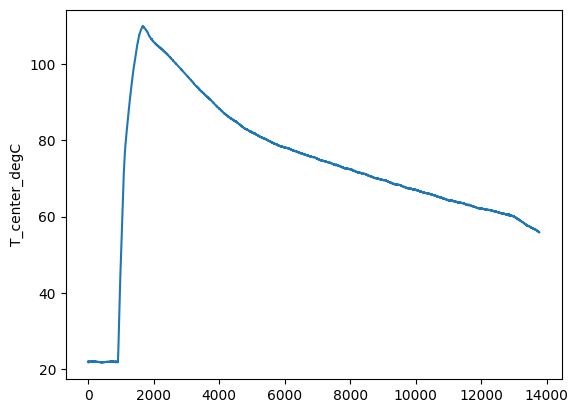

In [ ]:
df3 = pd.read_csv("ESC_75SOC.csv")
sns.lineplot(df3["T_center_degC"])

In [ ]:
np.savetxt('maximal_TR1.csv', maximal_TR1, delimiter=',')


In [ ]:
maximal_TR3 = np.zeros((5,4))
df3 = pd.read_csv("ESC_100ASOC.csv")
df3 = df3.iloc[:7500, :]
df3["time_ind"] = np.arange(1, df3.shape[0]+1)
df_s = build_signal_raw(df3, "time_ind", "T_center_degC")
for i in range(5):
    for j in range(4):
        df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = windowsize_lower[j], highwl = windowsize_upper[i])
        maximal_TR3[i,j] = df_detect["detected_value_rt"].max()
        print(i)
np.savetxt('maximal_TR3.csv', maximal_TR3, delimiter=',')


0
0
0
0
1
1
1
1
2
2
2
2
3
3
3
3
4
4
4
4


In [ ]:
maximal_TR4 = np.zeros((5,4))
df4 = pd.read_csv("ESC_75SOC.csv")
df4 = df4.iloc[:4000, :]
df4["time_ind"] = np.arange(1, df4.shape[0]+1)
df_s = build_signal_raw(df4, "time_ind", "T_center_degC")
for i in range(5):
    for j in range(4):
        df_detect = detect_realtime(df_s["time_ind"], df_s["signal"], lowwl = windowsize_lower[j], highwl = windowsize_upper[i])
        maximal_TR4[i,j] = df_detect["detected_value_rt"].max()
        print(i)
np.savetxt('maximal_TR4.csv', maximal_TR4, delimiter=',')


0
0
0
0
1
1
1
1
2
2
2
2
3
3
3
3
4
4
4
4


In [ ]:
#An additional dataset:


,Date_Time,Test_Time(s),Step_Time(s),Step_Index,Cycle_Index,Voltage(V),Current(A),Charge_Capacity(Ah),Discharge_Capacity(Ah),Charge_Energy(Wh),Discharge_Energy(Wh),Internal Resistance(Ohm),dV/dt(V/s),Aux_Temperature(¡æ)_1
0,2023-09-20 16:45:23.157,1200.00110,1200.0007,1,1,3.269925,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,NaN,-0.000074,34.674324
1,2023-09-20 17:05:23.157,2400.00040,2400.0000,1,1,3.270253,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,NaN,0.000034,34.641472
2,2023-09-20 17:25:23.157,3600.00090,3600.0005,1,1,3.271105,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,NaN,-0.000066,34.615887
3,2023-09-20 17:25:23.158,3600.00190,3600.0015,1,1,3.271106,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,NaN,-0.000066,34.615887
4,2023-09-20 17:26:23.205,3660.04914,60.0010,2,1,3.371581,1.455279,0.024253,2.116097e-07,0.081187,6.921304e-07,NaN,0.000572,34.503883


In [ ]:
df1 = pd.read_excel("20230920_sd_w9_Channel_3.xlsx", sheet_name = "Channel_3_1").iloc[:,5:13]

df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT"]

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdV4 Channel1'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

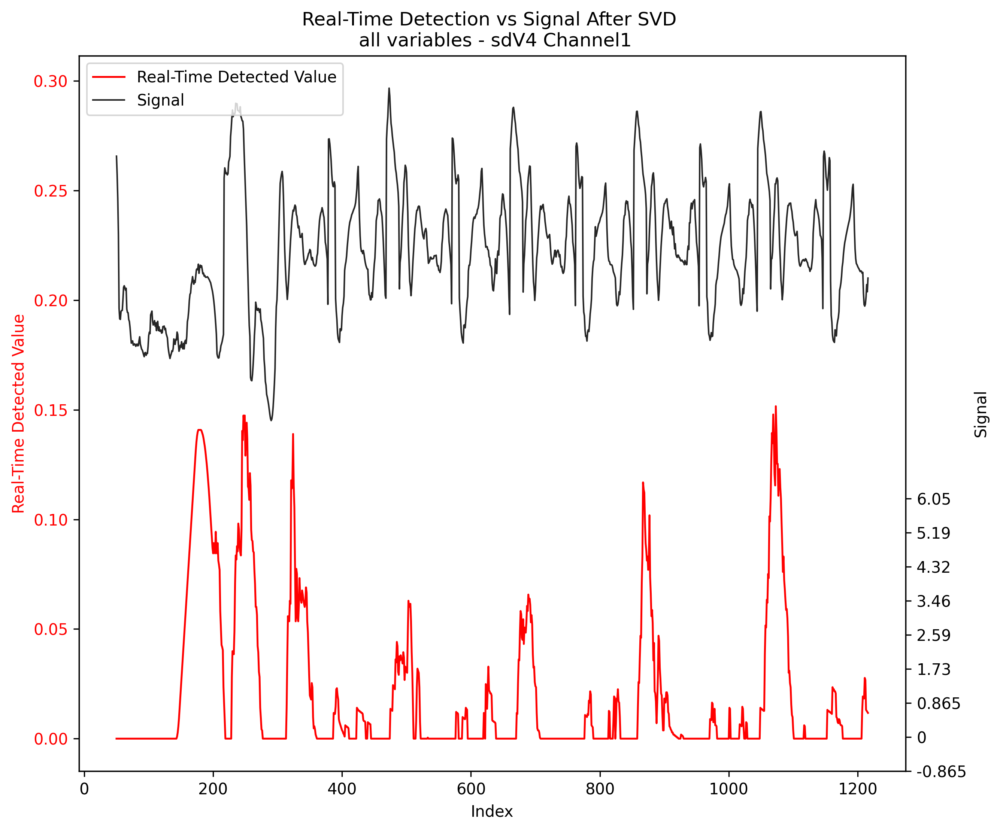

In [ ]:
df1 = pd.read_excel("20230920_sd_v4_Channel_1.xlsx", sheet_name = "Channel_1_1").iloc[:,5:14]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 30, highwl = 100)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdV4 Channel1")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdw9 Channel 3'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

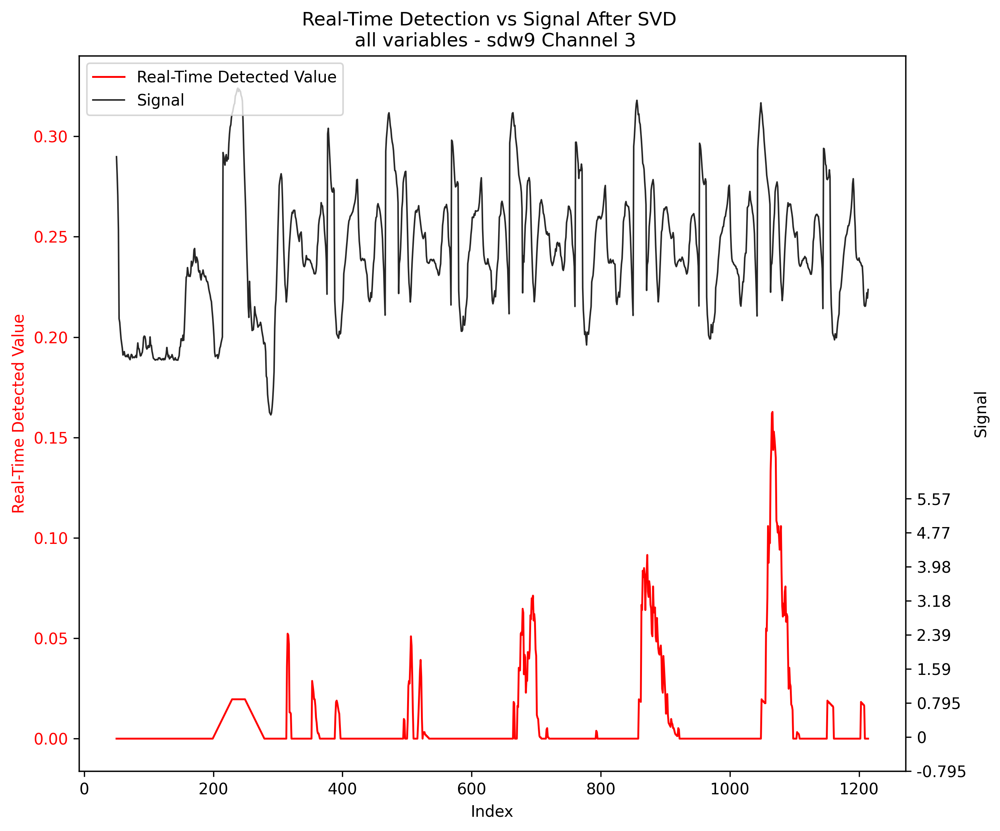

In [ ]:
df1 = pd.read_excel("20230920_sd_w9_Channel_3.xlsx", sheet_name = "Channel_3_1").iloc[:,5:14]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 100)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdw9 Channel 3")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdv10 Channel 5'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

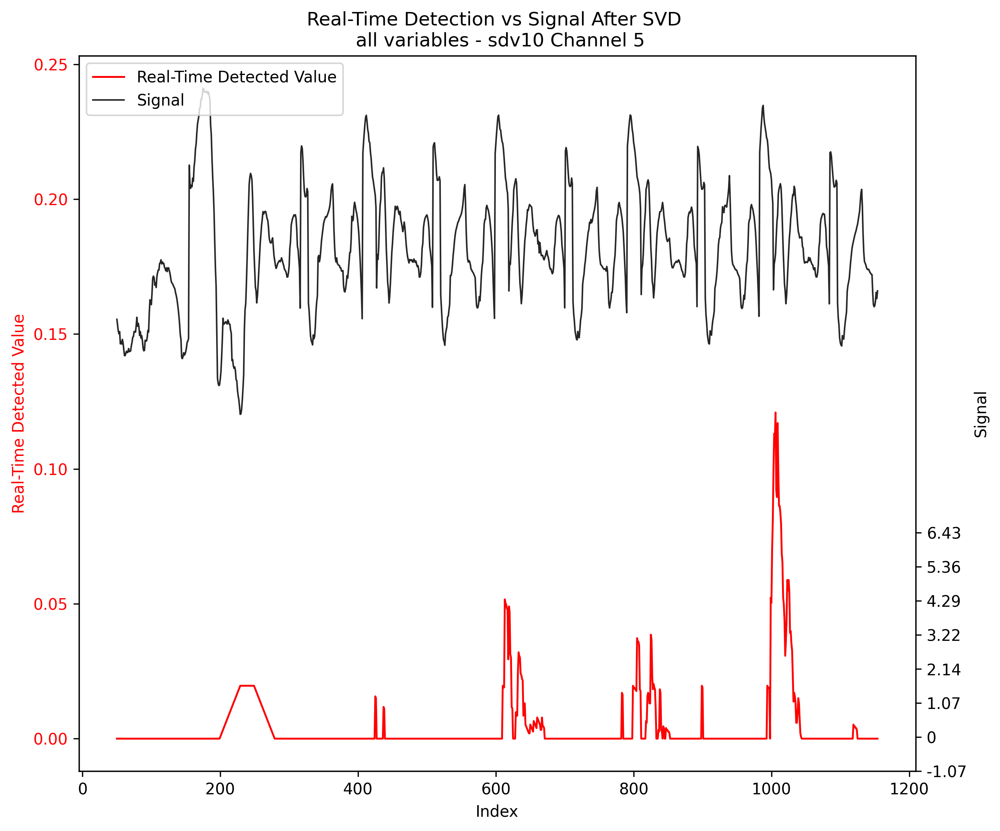

In [ ]:
df1 = pd.read_excel("20231001_sd_w10_Channel_5.xlsx", sheet_name = "Channel_5_1").iloc[:,5:14]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 100)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdv10 Channel 5")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdg1 Channel 6'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

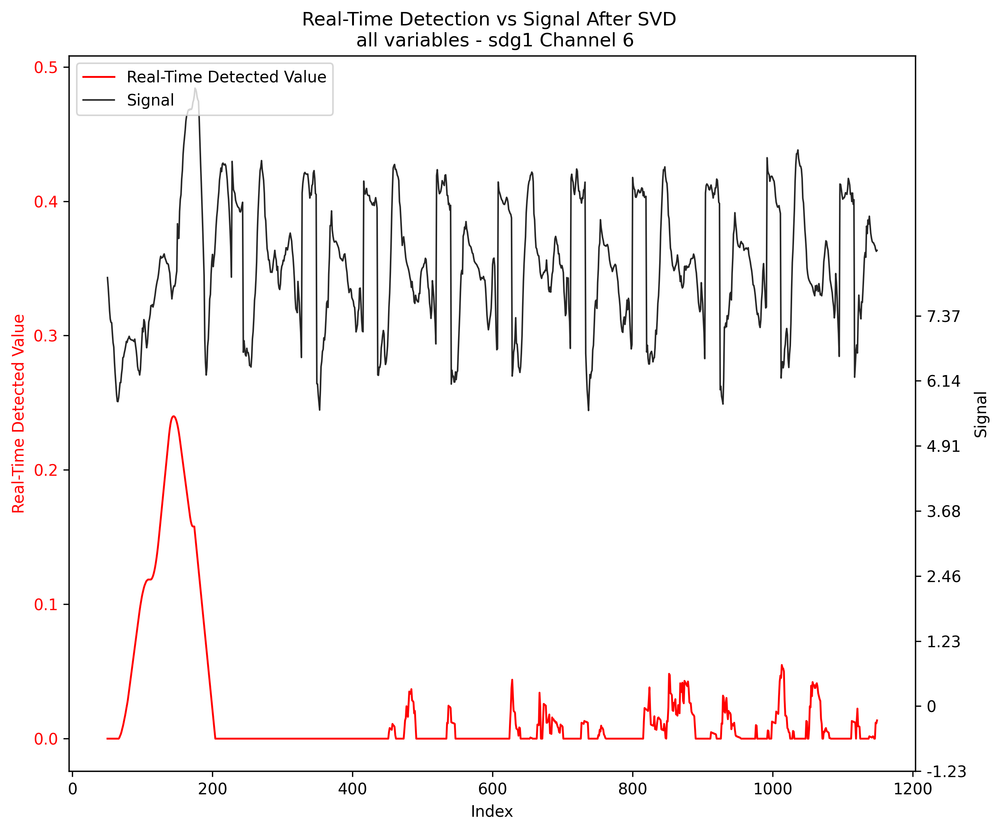

In [ ]:
df1 = pd.read_excel("20231001_sd_g1_Channel_6.xlsx", sheet_name = "Channel_6_1").iloc[:,5:14]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdg1 Channel 6")

<Axes: ylabel='T'>

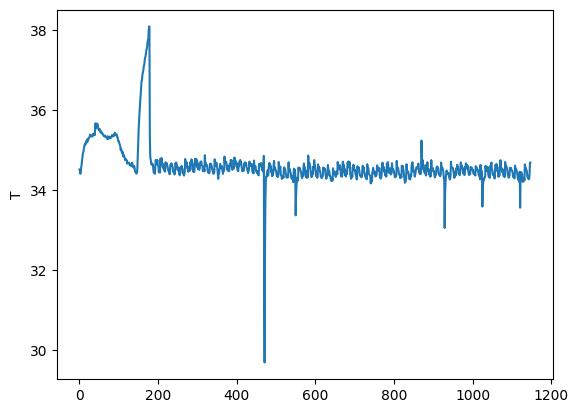

In [ ]:
sns.lineplot(df1["T"])

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdw8 Channel 2'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

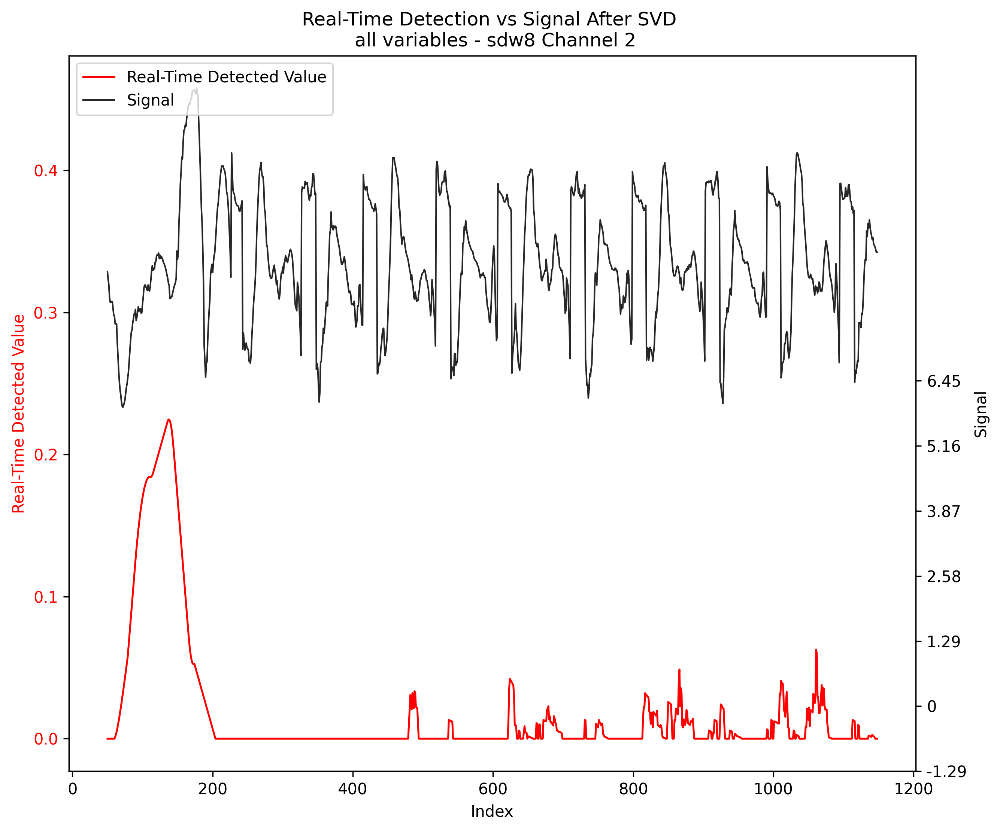

In [ ]:
#df1 = pd.read_excel("20231001_sd_w8_Channel_2.xlsx", sheet_name = "Channel_2_1").iloc[:,5:14]
#df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
#df1["time_ind"] = np.arange(1, df1.shape[0]+1)
#df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdw8 Channel 2")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdw10 Channel 5'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

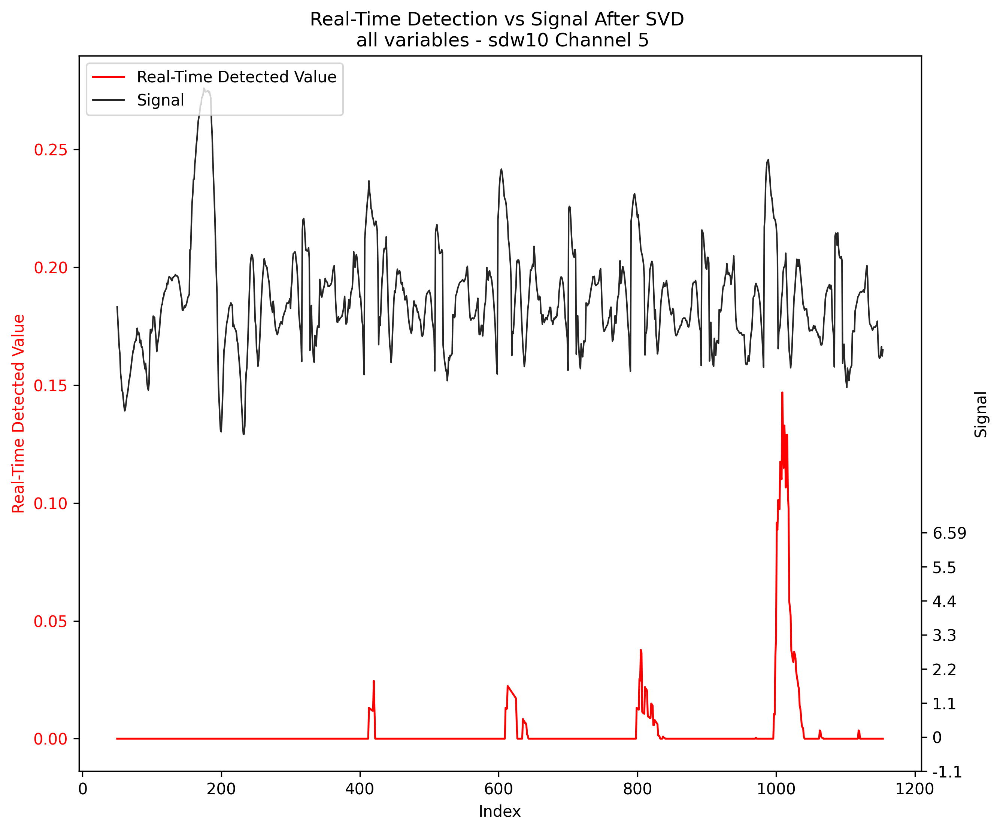

In [ ]:
df1 = pd.read_excel("20231001_sd_w10_Channel_5.xlsx", sheet_name = "Channel_5_1").iloc[:,5:14]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdw10 Channel 5")


In [ ]:
df1 = pd.read_excel("20221028_sd_g1_Channel_6.xlsx", sheet_name = "Channel_6_1")
df1.columns

Index(['Date_Time', 'Test_Time(s)', 'Step_Time(s)', 'Step_Index',
       'Cycle_Index', 'Voltage(V)', 'Current(A)', 'Charge_Capacity(Ah)',
       'Discharge_Capacity(Ah)', 'Charge_Energy(Wh)', 'Discharge_Energy(Wh)',
       'Internal Resistance(Ohm)', 'dV/dt(V/s)'],
      dtype='object')

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - sdV5 Channel 4'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

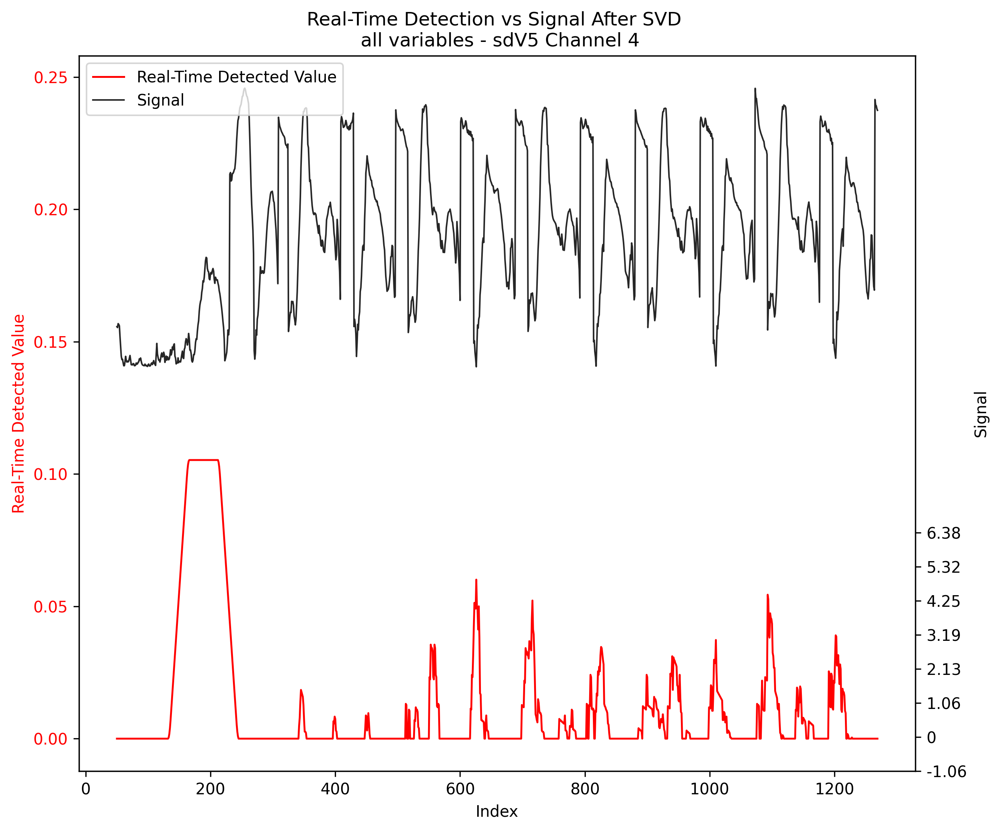

In [ ]:
df1 = pd.read_excel("20221028_sd_v5_Channel_4.xlsx", sheet_name = "Channel_4_1").iloc[:,5:13]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT", window = 50)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - sdV5 Channel 4")



<Axes: ylabel='T'>

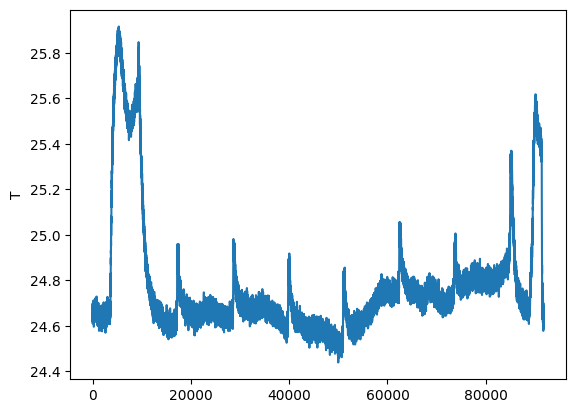

In [ ]:
sns.lineplot(df1["T"])

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - RPT-V5 Channel 4'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

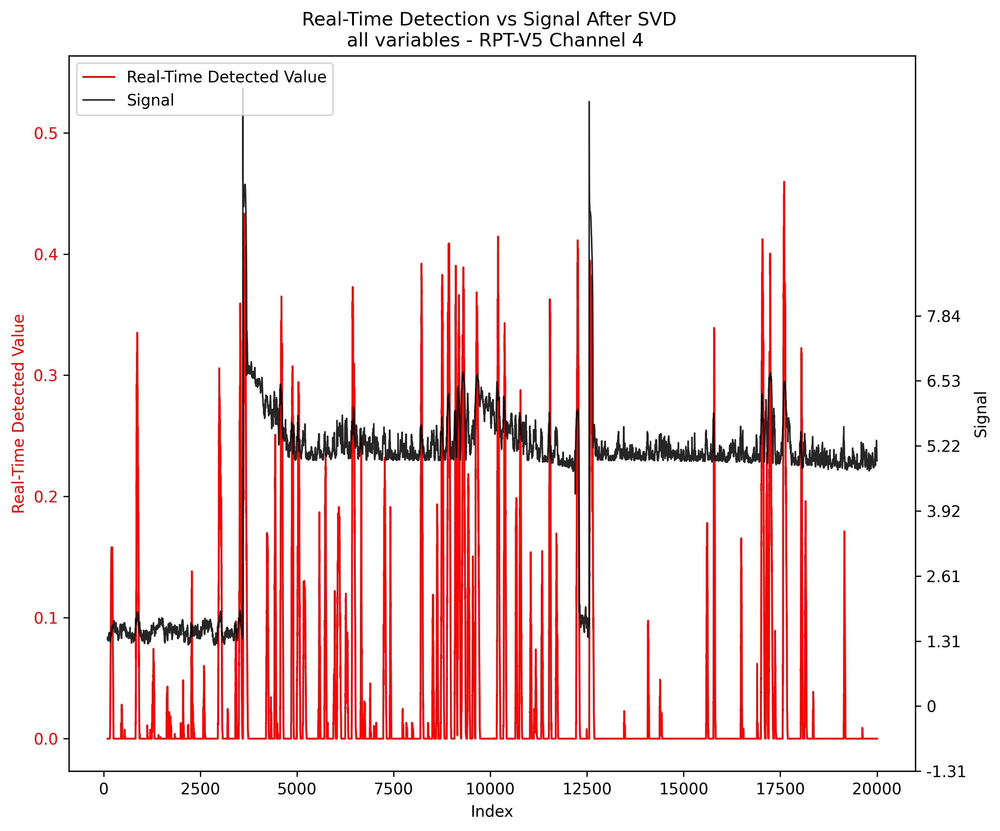

In [ ]:
df1 = pd.read_excel("20230116_v5_RPT_Channel_4.xlsx", sheet_name = "Channel_4_1").iloc[:,5:14]
df1 = df1.iloc[:20000,:]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 100)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - RPT-V5 Channel 4")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n all variables - RPT-W8 Channel 2'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

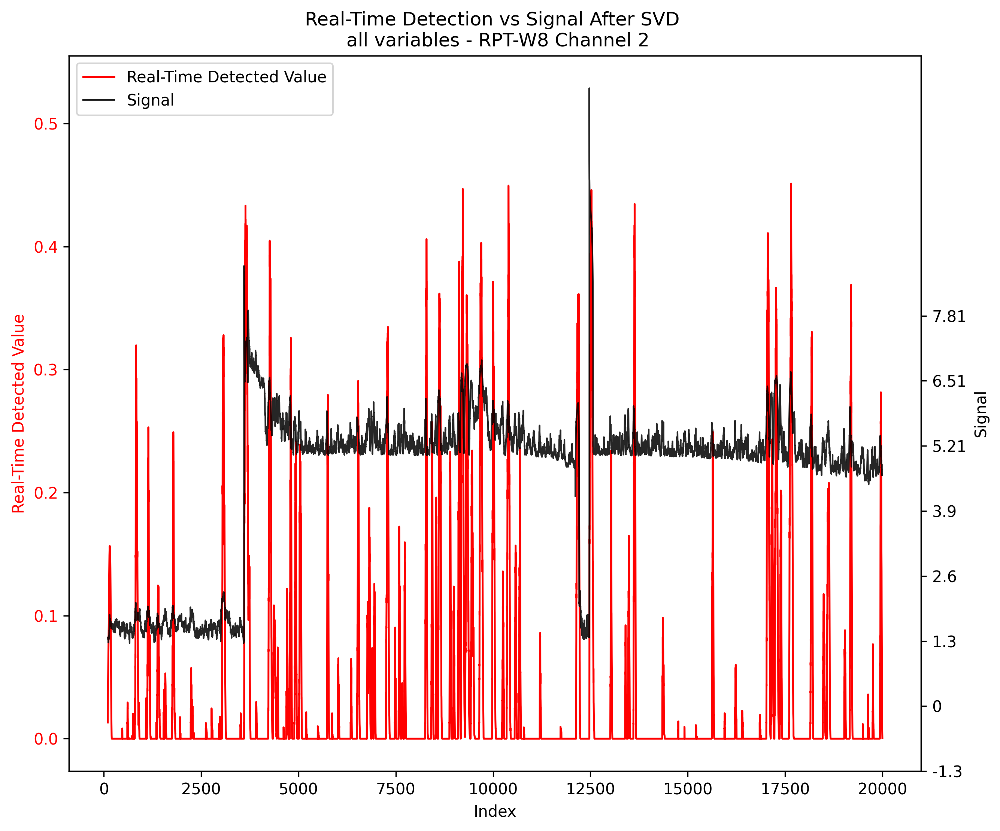

In [ ]:
df1 = pd.read_excel("20230116_w8_RPT_Channel_2.xlsx", sheet_name = "Channel_2_1").iloc[:,5:14]
df1 = df1.iloc[:20000,:]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 100)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - RPT-W8 Channel 2")


In [217]:
df0 = pd.read_excel("LFP_k1_0_05C_35degC.xlsx").iloc[:, 4:7]

In [218]:
df0.columns

Index(['Voltage(V)', 'Current(A)', 'Surface_Temp(degC)'], dtype='object')

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Galvano Static - 35 deg LFP K1 - 05C'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

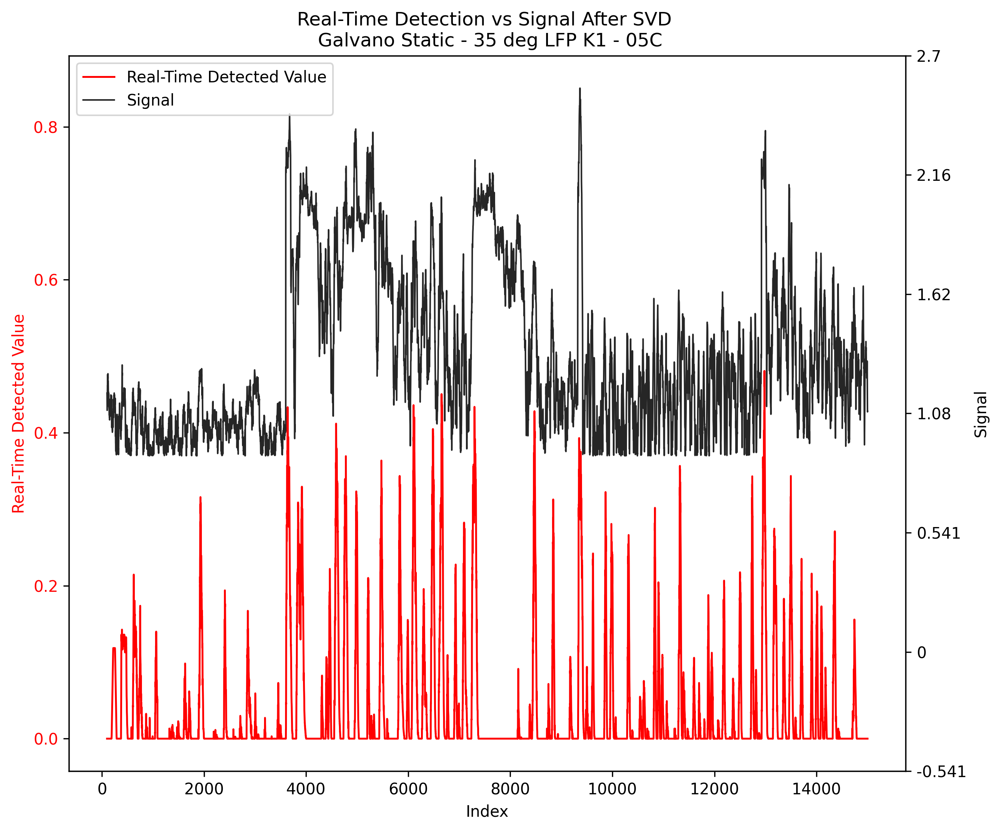

In [223]:
df1 = pd.read_excel("LFP_k1_0_05C_35degC.xlsx").iloc[:, 4:7]
df1 = df1.iloc[:15000,:]
df1.columns = ["V", "I", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|T", window = 500)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 100, highwl = 200)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Galvano Static - 35 deg LFP K1 - 05C")


Streaming output truncated to the last 5000 lines.
9501
9502
9503
9504
9505
9506
9507
9508
9509
9510
9511
9512
9513
9514
9515
9516
9517
9518
9519
9520
9521
9522
9523
9524
9525
9526
9527
9528
9529
9530
9531
9532
9533
9534
9535
9536
9537
9538
9539
9540
9541
9542
9543
9544
9545
9546
9547
9548
9549
9550
9551
9552
9553
9554
9555
9556
9557
9558
9559
9560
9561
9562
9563
9564
9565
9566
9567
9568
9569
9570
9571
9572
9573
9574
9575
9576
9577
9578
9579
9580
9581
9582
9583
9584
9585
9586
9587
9588
9589
9590
9591
9592
9593
9594
9595
9596
9597
9598
9599
9600
9601
9602
9603
9604
9605
9606
9607
9608
9609
9610
9611
9612
9613
9614
9615
9616
9617
9618
9619
9620
9621
9622
9623
9624
9625
9626
9627
9628
9629
9630
9631
9632
9633
9634
9635
9636
9637
9638
9639
9640
9641
9642
9643
9644
9645
9646
9647
9648
9649
9650
9651
9652
9653
9654
9655
9656
9657
9658
9659
9660
9661
9662
9663
9664
9665
9666
9667
9668
9669
9670
9671
9672
9673
9674
9675
9676
9677
9678
9679
9680
9681
9682
9683
9684
9685
9686
9687
9688
9689
9690

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Galvano Static - 25 deg NMC k5 - 3C'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

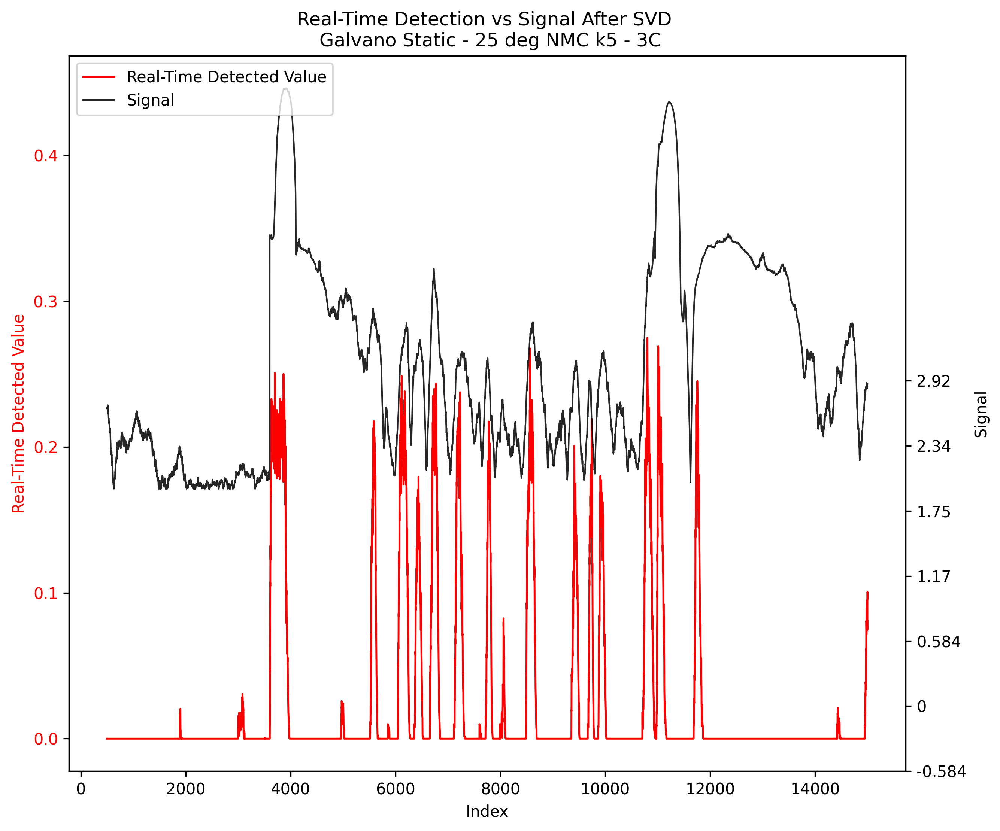

In [228]:
#df1 = pd.read_excel("NMC_k5_3C_25degC.xlsx").iloc[:, 4:7]
#df1 = df1.iloc[:15000,:]
#df1.columns = ["V", "I", "T"]
#df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|T", window = 500)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 100, highwl = 200)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Galvano Static - 25 deg NMC k5 - 3C")

Streaming output truncated to the last 5000 lines.
9501
9502
9503
9504
9505
9506
9507
9508
9509
9510
9511
9512
9513
9514
9515
9516
9517
9518
9519
9520
9521
9522
9523
9524
9525
9526
9527
9528
9529
9530
9531
9532
9533
9534
9535
9536
9537
9538
9539
9540
9541
9542
9543
9544
9545
9546
9547
9548
9549
9550
9551
9552
9553
9554
9555
9556
9557
9558
9559
9560
9561
9562
9563
9564
9565
9566
9567
9568
9569
9570
9571
9572
9573
9574
9575
9576
9577
9578
9579
9580
9581
9582
9583
9584
9585
9586
9587
9588
9589
9590
9591
9592
9593
9594
9595
9596
9597
9598
9599
9600
9601
9602
9603
9604
9605
9606
9607
9608
9609
9610
9611
9612
9613
9614
9615
9616
9617
9618
9619
9620
9621
9622
9623
9624
9625
9626
9627
9628
9629
9630
9631
9632
9633
9634
9635
9636
9637
9638
9639
9640
9641
9642
9643
9644
9645
9646
9647
9648
9649
9650
9651
9652
9653
9654
9655
9656
9657
9658
9659
9660
9661
9662
9663
9664
9665
9666
9667
9668
9669
9670
9671
9672
9673
9674
9675
9676
9677
9678
9679
9680
9681
9682
9683
9684
9685
9686
9687
9688
9689
9690

(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Galvano Static - 05degC NCA k2 - 2C'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

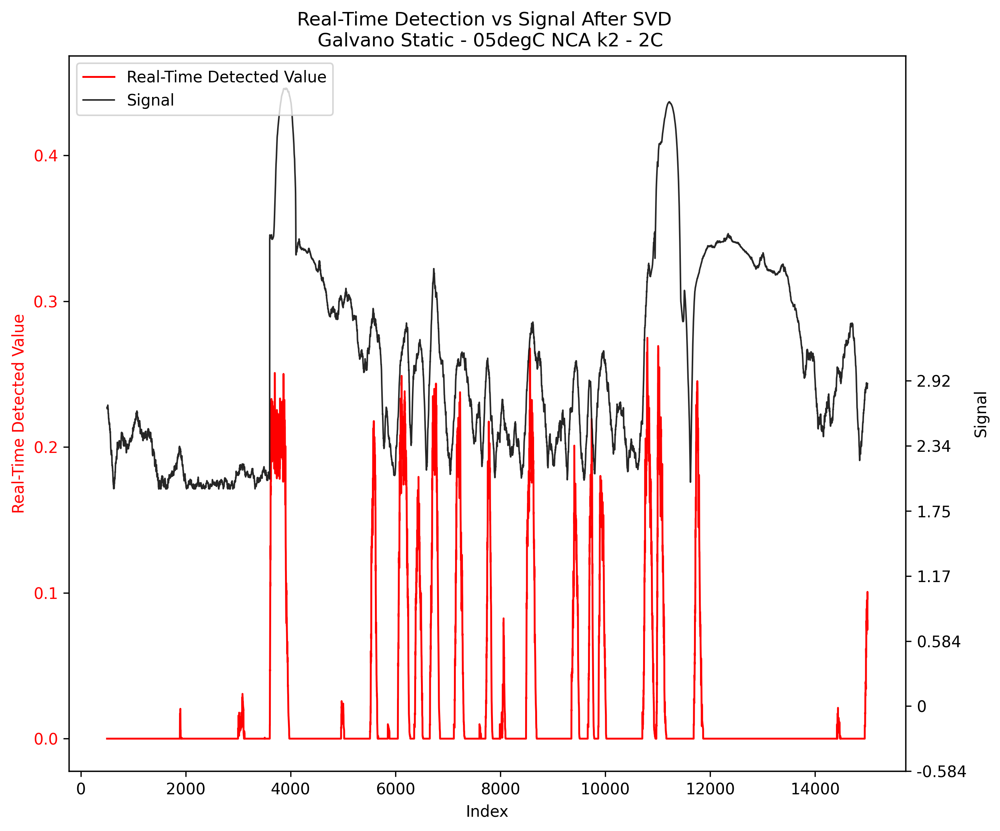

In [229]:
df1 = pd.read_excel("NCA_k2_2C_05degC.xlsx").iloc[:, 4:7]
df1 = df1.iloc[:15000,:]
df1.columns = ["V", "I", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|T", window = 500)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 100, highwl = 200)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Galvano Static - 05degC NCA k2 - 2C")


(<Figure size 2700x2250 with 2 Axes>,
 <Axes: title={'center': 'Real-Time Detection vs Signal After SVD \n Galvano Static - 35egC LFP k3 - 20C'}, xlabel='Index', ylabel='Real-Time Detected Value'>,
 <Axes: ylabel='Signal'>)

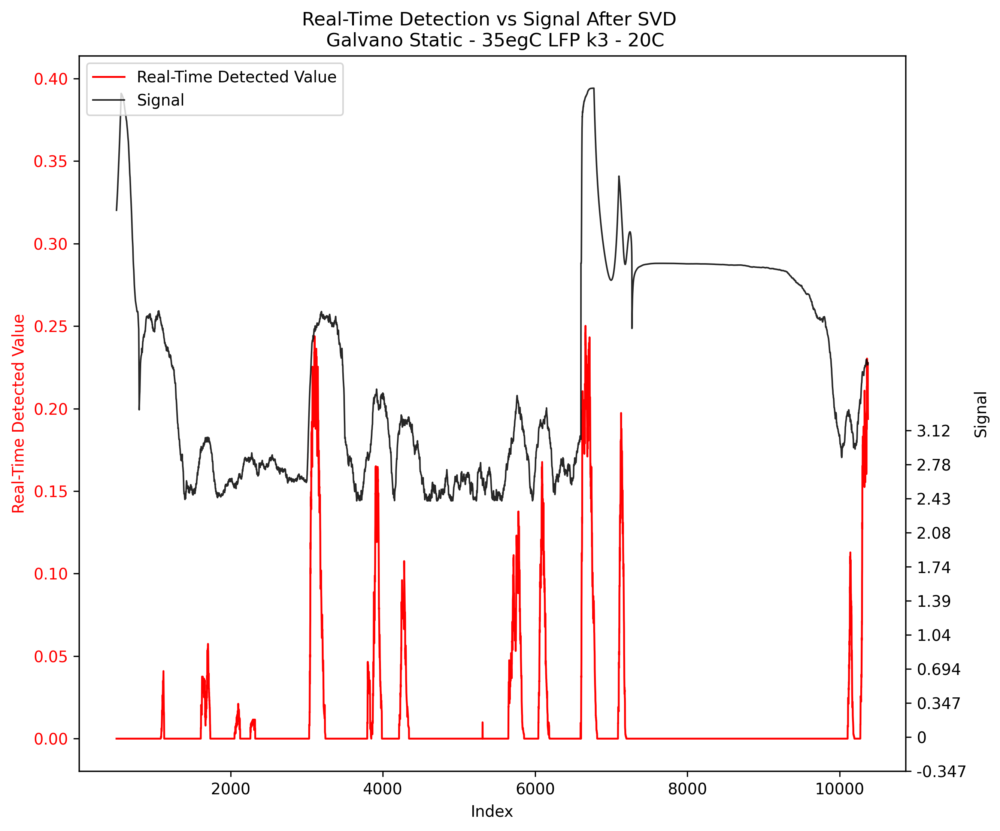

In [232]:
#df1 = pd.read_excel("LFP_k3_20C_35degC.xlsx").iloc[:, 4:7]
#df1 = df1.iloc[:12500,:]
#df1.columns = ["V", "I", "T"]
#df1["time_ind"] = np.arange(1, df1.shape[0]+1)
#df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|T", window = 500)
#df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 100, highwl = 200)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n Galvano Static - 35egC LFP k3 - 20C")


In [ ]:
df1 = pd.read_excel("20230116_w8_RPT_Channel_2.xlsx", sheet_name = "Channel_2_1").iloc[:,5:14]
df1 = df1.iloc[:20000,:]
df1.columns = ["V", "I", "Ah_C", "Ah_D", "Wh_C", "Wh_D", "R", "dVdT", "T"]
df1["time_ind"] = np.arange(1, df1.shape[0]+1)
df_svd = build_signal_svd(df1, time = "time_ind", x_cols = "V|I|Ah_C|Ah_D|Wh_C|Wh_D|dVdT|T", window = 100)
df_detect = detect_realtime(df_svd["time_ind"], df_svd["signal"], lowwl = 50, highwl = 125)
plot_detection_overlay(df_detect, title = "Real-Time Detection vs Signal After SVD \n all variables - RPT-W8 Channel 2")


<Axes: ylabel='Voltage(V)'>

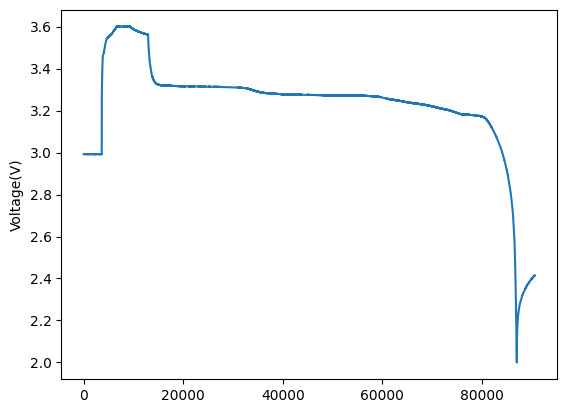

In [ ]:
sns.lineplot(df0["Voltage(V)"])